---
title: "Global data on sustainable energy"
author: "Erick Borda"
date: "2023-11-03"
output: pdf_document
---

# **Energy consumption and CO2 emissions predictions and forecasts analysis project**

The main goal of this project is to methodically identify and select an optimal machine learning model. This model should possess the capability to predict, with accuracy, the future patterns of energy consumption and forecast carbon dioxide emissions specifically for three distinct countries across the upcoming five-year span

## **1. Exploratory Data Analysis (EDA).**

Exploratory Data Analysis (EDA) marks the primary phase of analysing data. It involves uncovering insights into the dataset's contents, characteristics, and size

### **1.1. Importing the libraries and Dataset**

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.preprocessing import LabelEncoder
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.linear_model import LinearRegression
import plotly.graph_objs as go
import plotly.express as px
from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy.stats import chi2_contingency
from scipy.stats import chi2
import scipy.stats as stats
from numpy import median
from numpy import std
import seaborn as sns

In [ ]:
# Warnings configuration
# ==============================================================================
import warnings
warnings.filterwarnings('once')
warnings.filterwarnings('ignore', category=ImportWarning)


### **1.2. Importing the dataset**

In [ ]:
df = pd.read_csv('global-data-on-sustainable-energy.csv')
df.head()

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),...,Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,Renewables (% equivalent primary energy),gdp_growth,gdp_per_capita,Density\n(P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,...,302.59482,1.64,760.000000,NaN,NaN,NaN,60,"6,52,230",33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,...,236.89185,1.74,730.000000,NaN,NaN,NaN,60,"6,52,230",33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,...,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,"6,52,230",33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,...,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,"6,52,230",33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,...,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,"6,52,230",33.93911,67.709953


### **1.3. Datatypes and dimensions**

In [ ]:
def df_info_to_dataframe(df):
    '''
    This function returns a dataframe with the information of the columns of a dataframe
    :param df: Dataframe to be analyzed
    :return: Information of the columns of a dataframe
    '''
    # Extracting information for each column
    info_data = {
        'Column Name': [],
        'Non-Null Count': [],
        'Data Type': []
    }

    for col in df.columns:
        info_data['Column Name'].append(col)
        info_data['Non-Null Count'].append(df[col].notnull().sum())
        info_data['Data Type'].append(df[col].dtype)

    # Creating a new DataFrame from the extracted information
    info_df = pd.DataFrame(info_data)
    return info_df

In [ ]:
info_df = df_info_to_dataframe(df)
info_df

,Column Name,Non-Null Count,Data Type
0,Entity,3649,object
1,Year,3649,int64
2,Access to electricity (% of population),3639,float64
3,Access to clean fuels for cooking,3480,float64
4,Renewable-electricity-generating-capacity-per-...,2718,float64
5,Financial flows to developing countries (US $),1560,float64
6,Renewable energy share in the total final ener...,3455,float64
7,Electricity from fossil fuels (TWh),3628,float64
8,Electricity from nuclear (TWh),3523,float64
9,Electricity from renewables (TWh),3628,float64


### **1.4. Descriptive statistics**

In [ ]:
description = df.describe()
# Transpose the output to switch columns and rows
transposed_description = description.T
transposed_description

,count,mean,std,min,25%,50%,75%,max
Year,3649.0,2.010038e+03,6.054228e+00,2000.000000,2005.000000,2.010000e+03,2.015000e+03,2.020000e+03
Access to electricity (% of population),3639.0,7.893370e+01,3.027554e+01,1.252269,59.800890,9.836157e+01,1.000000e+02,1.000000e+02
Access to clean fuels for cooking,3480.0,6.325529e+01,3.904366e+01,0.000000,23.175000,8.315000e+01,1.000000e+02,1.000000e+02
Renewable-electricity-generating-capacity-per-capita,2718.0,1.131375e+02,2.441673e+02,0.000000,3.540000,3.291000e+01,1.122100e+02,3.060190e+03
Financial flows to developing countries (US $),1560.0,9.422400e+07,2.981544e+08,0.000000,260000.000000,5.665000e+06,5.534750e+07,5.202310e+09
Renewable energy share in the total final energy consumption (%),3455.0,3.263816e+01,2.989490e+01,0.000000,6.515000,2.330000e+01,5.524500e+01,9.604000e+01
Electricity from fossil fuels (TWh),3628.0,7.036500e+01,3.480519e+02,0.000000,0.290000,2.970000e+00,2.683750e+01,5.184130e+03
Electricity from nuclear (TWh),3523.0,1.345019e+01,7.300662e+01,0.000000,0.000000,0.000000e+00,0.000000e+00,8.094100e+02
Electricity from renewables (TWh),3628.0,2.396801e+01,1.044311e+02,0.000000,0.040000,1.470000e+00,9.600000e+00,2.184940e+03
Low-carbon electricity (% electricity),3607.0,3.680118e+01,3.431488e+01,0.000000,2.877847,2.786507e+01,6.440379e+01,1.000000e+02


### **1.5. Data distribution**

In [ ]:
def visualize_data(df, plot_type='numeric'):
  """
    Visualize the data in a DataFrame.
  :param df: Data frame to visualize
  :param plot_type: Type of plot to create. Either for columns that are 'numeric' or 'categorical'
  :return:
  """

  numeric_columns = df.select_dtypes(include='number').columns
  categorical_columns = df.select_dtypes(exclude='number').columns

  if plot_type == 'numeric':
        # Plot histograms for numeric columns
        num_plots = len(numeric_columns)
        num_rows = (num_plots // 3) + (1 if num_plots % 3 > 0 else 0)
        plt.figure(figsize=(15, 5*num_rows))

        for i, column in enumerate(numeric_columns, 1):
            plt.subplot(num_rows, 3, i)
            plt.hist(df[column], bins='auto')  # Adjust bins as needed
            plt.xlabel(column)
            plt.ylabel('Frequency')
            plt.title(f'Histogram of \n {column}')

        plt.tight_layout()
        plt.show()

  elif plot_type == 'categorical':
        # Plot bar plots for categorical columns
        cat_plots = len(categorical_columns)
        cat_rows = (cat_plots // 3) + (1 if cat_plots % 3 > 0 else 0)
        plt.figure(figsize=(15, 5*cat_rows))

        for i, column in enumerate(categorical_columns, 1):
            plt.subplot(cat_rows, 3, i)
            df[column].value_counts().plot(kind='bar')
            plt.xlabel(column)
            plt.ylabel('Frequency')
            plt.title(f'Bar Plot of {column}')

        plt.tight_layout()
        plt.show()

  else:
        print("Invalid plot type. Please choose 'numeric' or 'categorical'.")

#### **1.5.1. Numerical columns (Histograms)**

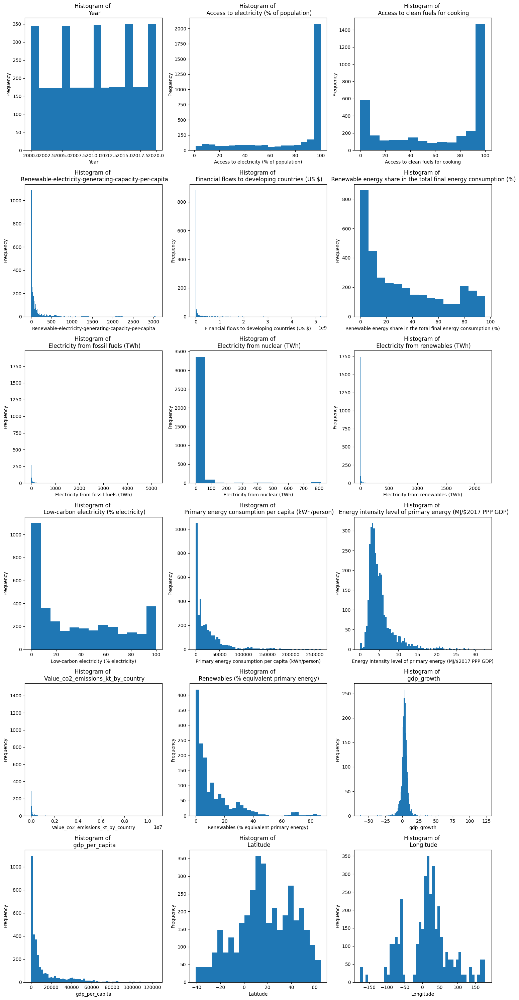

In [ ]:
visualize_data(df, plot_type='numeric')

#### **1.5.2. Categorical columns (Bar plots)**

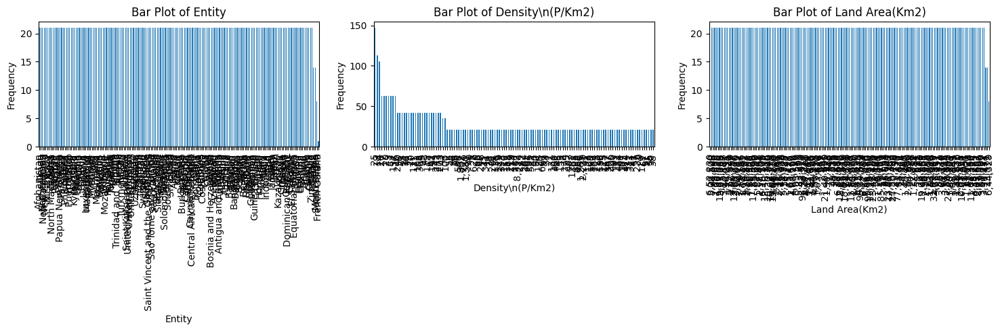

In [ ]:
visualize_data(df, plot_type='categorical')

### **1.6. Missing values**

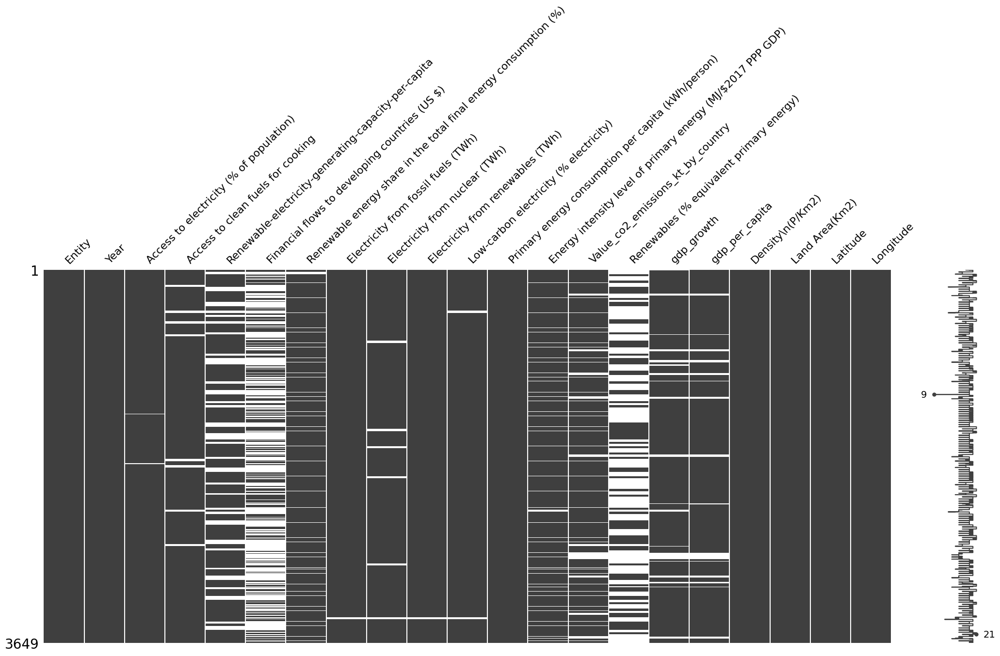

In [ ]:
msno.matrix(df)  # Creates a matrix showing missing values
plt.show()

### **1.7. Multiplot Analysis**

In [ ]:
def multiline_plot_px(df,x_column,y_column,color_column,title):
    """
    Create an interactive multiline plot using Plotly Express
    :param df: Data frame to visualize
    :param x_column: Column to use for the x-axis
    :param y_column: Column to use for the y-axis
    :param color_column: Column to use for the color
    :param title: Interactive multiline plot title
    :return: Plotly Express multiline plot
    """
    # Create an interactive multiline plot using Plotly Express
    fig = px.line(df, x=x_column, y=y_column, color=color_column,
                  markers=True, title=title)
    #x_column to upper case
    fig.update_layout(xaxis_title=x_column.upper(), yaxis_title=y_column.upper())
    fig.show()

#### **1.7.1. Interactive multiline plot of Energy Consumption vs. Year**

In [ ]:
# Descriptive variables for parameters
x_axis = 'Year'
y_axis = 'Primary energy consumption per capita (kWh/person)'
category = 'Entity'
plot_title = 'Interactive Multiline Plot of Energy Consumption vs. Year'

# Function call
multiline_plot_px(df, x_axis, y_axis, category, plot_title)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


#### **1.7.2. Interactive multiline plot of CO2 Emissions vs. Year**

In [ ]:
# Descriptive variables for parameters
x_axis = 'Year'
y_axis = 'Value_co2_emissions_kt_by_country'
category = 'Entity'
plot_title = 'Interactive Multiline Plot of CO2 Emissions vs. Year'
# Function call
multiline_plot_px(df, x_axis, y_axis, category, plot_title)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



#### **1.7.3. Interactive Multiline Plot of GDP per Capita vs. Year**

In [ ]:
# Descriptive variables for parameters
x_axis = 'Year'
y_axis = 'gdp_per_capita'
category = 'Entity'
plot_title = 'Interactive Multiline Plot of GDP per Capita vs. Year'
# Function call
multiline_plot_px(df, x_axis, y_axis, category, plot_title)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



#### **1.7.4. Interactive Multiline Plot of GDP growth vs. Year**

In [ ]:
# Descriptive variables for parameters
x_axis = 'Year'
y_axis = 'gdp_growth'
category = 'Entity'
plot_title = 'Interactive Multiline Plot of GDP growth vs. Year'
# Function call
multiline_plot_px(df, x_axis, y_axis, category, plot_title)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



#### **1.7.5. Interactive Multiline Plot of Density per Km2 vs. Year**

In [ ]:
# Descriptive variables for parameters
x_axis = 'Year'
y_axis = r'Density\n(P/Km2)'
category = 'Entity'
plot_title = 'Interactive Multiline Plot of Density per Km2 vs. Year'
# Function call
multiline_plot_px(df, x_axis, y_axis, category, plot_title)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



The density column plays a pivotal role in deriving the total energy consumption per country. As illustrated in Figure above, the data displays a consistent pattern. However, this continuity suggests potential inaccuracies within the dataset. Therefore, employing alternative methodologies becomes imperative to achieve the anticipated outcomes. Further exploration is required to ensure the data accuracy, potentially necessitating more sophisticated analytical techniques to rectify discrepancies and obtain more reliable results

### **1.8. Correlation**

In [ ]:
def correlation_heatmap(df):
    '''
    This function will plot a correlation heatmap for a given DataFrame.
    :param df: Data frame to plot
    :return: Correlation heatmap
    '''
    # Calculate the correlation matrix
    correlation_matrix = df.corr()

    # Increase the figure size and adjust font size of labels
    plt.figure(figsize=(12, 12))

    # Create the heatmap with annotations
    heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f',
                          linewidths=.5, square=True, cbar_kws={"shrink": .5})

    # Improve the readability of the annotation text
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(rotation=0, fontsize=10)

    plt.title('Correlation Matrix Heatmap', fontsize=14)
    plt.show()

<ipython-input-17-a5c861377807>:8: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



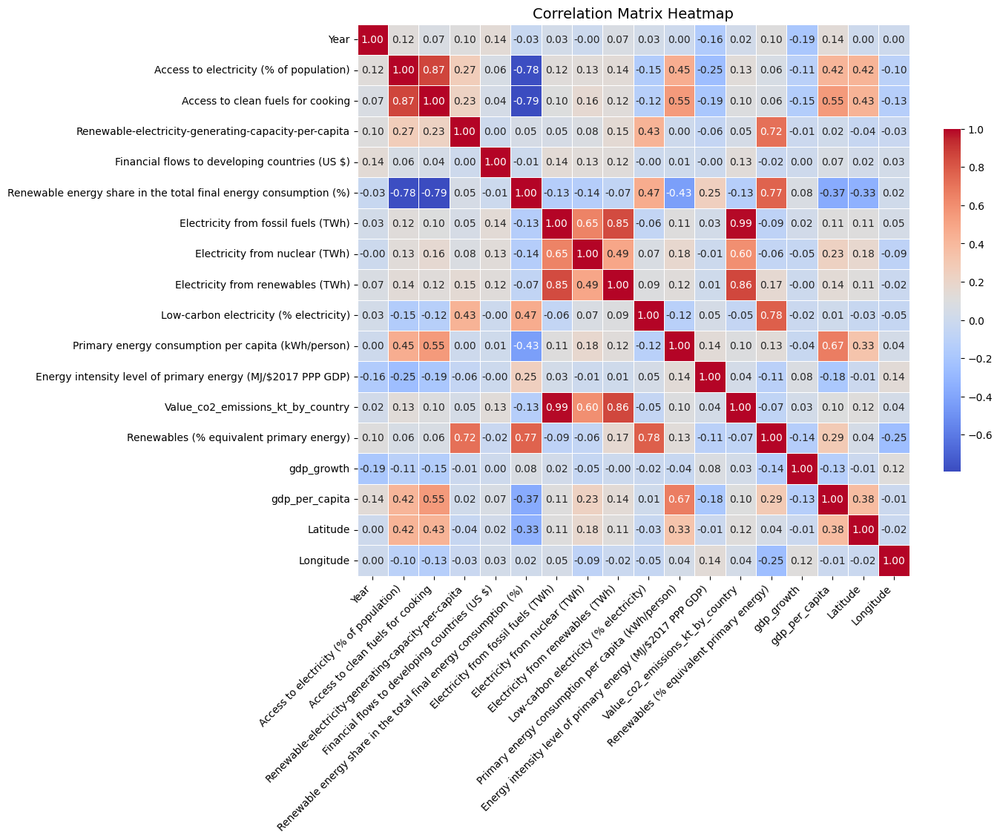

In [ ]:
correlation_heatmap(df)

## **2. Data Preprocessing**

Data preprocessing techniques enhance data quality, crucial for accuracy and efficiency. This step is vital in knowledge discovery as quality decisions rely on quality data. Detecting and rectifying data anomalies early on, along with reducing the data for analysis, significantly benefits decision-making processes

### **2.1. Standardizing Dataset Columns and Fixing Data Types**

Before perfoming the cleaning is necessary to fix some noticeble errors within the structure of the dataset
Renaming Columns.

*   All columns must be lowercase.
*   Replace special characters.
*   Replace spaces using hyphens.

In [ ]:
def standardize_col_names(df):
    '''
    This function will standardize the column names of a DataFrame.
    :param df: Data frame to standardize
    :return: Data frame with standardized column names
    '''
    df.columns = df.columns.str.lower()  # Convert to lowercase
    df.columns = df.columns.str.replace('[^A-Za-z0-9]+', '-')  # Replace special characters with hyphens
    df.columns = df.columns.str.replace(' ', '-')  # Replace spaces with hyphens
    df.columns = df.columns.str.rstrip('-')  # Remove trailing hyphens
    return df

energy_df = df.copy()
energy_df = standardize_col_names(energy_df)
energy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 21 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   entity                                                        3649 non-null   object 
 1   year                                                          3649 non-null   int64  
 2   access-to-electricity-of-population                           3639 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3480 non-null   float64
 4   renewable-electricity-generating-capacity-per-capita          2718 non-null   float64
 5   financial-flows-to-developing-countries-us                    1560 non-null   float64
 6   renewable-energy-share-in-the-total-final-energy-consumption  3455 non-null   float64
 7   electricity-from-fossil-fuels-twh                             3628 no

<ipython-input-19-4db96c3bca1f>:8: FutureWarning:

The default value of regex will change from True to False in a future version.



### **2.2. Fixing Data Types**

During the Exploratory Data Analysis (EDA), two numeric columns were found to have an 'object' data type, which ideally should be represented as 'float'

In [ ]:
energy_df = energy_df.rename(columns={'entity': 'country'})
energy_df['density-n-p-km2'] = energy_df['density-n-p-km2'].str.replace(',', '').astype(float)
energy_df['land-area-km2'] = energy_df['land-area-km2'].astype(str).str.replace(',', '').astype(float)
energy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 21 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   object 
 1   year                                                          3649 non-null   int64  
 2   access-to-electricity-of-population                           3639 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3480 non-null   float64
 4   renewable-electricity-generating-capacity-per-capita          2718 non-null   float64
 5   financial-flows-to-developing-countries-us                    1560 non-null   float64
 6   renewable-energy-share-in-the-total-final-energy-consumption  3455 non-null   float64
 7   electricity-from-fossil-fuels-twh                             3628 no

In [ ]:
def multiplot_energy(df):
    x_axis = 'year'
    y_axis = 'primary-energy-consumption-per-capita-kwh-person'
    category = 'country'
    plot_title = 'Interactive Multiline Plot of Energy Consumption vs. Year'
    multiline_plot_px(df, x_axis, y_axis, category, plot_title)

def multiplot_co2(df):
    x_axis = 'year'
    y_axis = 'value-co2-emissions-kt-by-country'
    category = 'country'
    plot_title = 'Interactive Multiline Plot of CO2 Emissions vs. Year'
    multiline_plot_px(df, x_axis, y_axis, category, plot_title)

def multiplot_gdp_per_capita(df):
    x_axis = 'year'
    y_axis = 'gdp-per-capita'
    category = 'country'
    plot_title = 'Interactive Multiline Plot of GDP per Capita vs. Year'
    multiline_plot_px(df, x_axis, y_axis, category, plot_title)

def multiplot_gdp_growth(df):
    x_axis = 'year'
    y_axis = 'gdp-growth'
    category = 'country'
    plot_title = 'Interactive Multiline Plot of GDP growth vs. Year'
    multiline_plot_px(df, x_axis, y_axis, category, plot_title)

def multiplot_density(df):
    x_axis = 'year'
    y_axis = 'density-n-p-km2'
    category = 'country'
    plot_title = 'Interactive Multiline Plot of Density per Km2 vs. Year'
    multiline_plot_px(df, x_axis, y_axis, category, plot_title)



### **2.3. Missing Values**

In [ ]:
def summary_null_data(df):
    '''
    This function will return a summary of the missing values in a DataFrame.
    :param df: Data frame to summarize
    :return: Data frame with summary of missing values
    '''
    nulldata = pd.DataFrame(df.isnull().sum().sort_values(ascending=False)[:25])
    nulldata = nulldata.rename(columns = {0 : 'Null Values'})
    # Calculate and add the percentage of missing values with formatting
    nulldata['Percentage Missing'] = (nulldata['Null Values'] / len(df)) * 100
    nulldata['Percentage Missing'] = nulldata['Percentage Missing'].map('{:.2f}%'.format)
    return nulldata

In [ ]:
summary_null_data(energy_df)

,Null Values,Percentage Missing
renewables-equivalent-primary-energy,2137,58.56%
financial-flows-to-developing-countries-us,2089,57.25%
renewable-electricity-generating-capacity-per-capita,931,25.51%
value-co2-emissions-kt-by-country,428,11.73%
gdp-growth,317,8.69%
gdp-per-capita,282,7.73%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,207,5.67%
renewable-energy-share-in-the-total-final-energy-consumption,194,5.32%
access-to-clean-fuels-for-cooking,169,4.63%
electricity-from-nuclear-twh,126,3.45%


Identifying missing values we can say that columns Renewables (% equivalent primary energy), Financial flows to developing countries (US $) will be remove because the percentage of the missing values above 50%, Renewable-electricity-generating-capacity-per-capita will be remove as fell becase its percentage is 25% and has no relevance to our research questions

In [ ]:
columns_to_remove = ['renewables-equivalent-primary-energy', 'financial-flows-to-developing-countries-us','renewable-electricity-generating-capacity-per-capita']
df_energy_clean = energy_df.drop(columns=columns_to_remove)
df_energy_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 18 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   object 
 1   year                                                          3649 non-null   int64  
 2   access-to-electricity-of-population                           3639 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3480 non-null   float64
 4   renewable-energy-share-in-the-total-final-energy-consumption  3455 non-null   float64
 5   electricity-from-fossil-fuels-twh                             3628 non-null   float64
 6   electricity-from-nuclear-twh                                  3523 non-null   float64
 7   electricity-from-renewables-twh                               3628 no

Given the unique nature of the data, we won't resort to traditional imputation or interpolation methods to address missing values. However, for educational purposes, is necessary to illustrate the importance of exercising caution before applying any technique. Additional factors to consider in this context would involve carefully analysing data on a per-country and per-column basis. On the table below is deatil the countries with missing values.




| Missing values on 'CO2 Emission by Country' | # Countries | Technique       |
| ------------------------------------------- | ----------- | --------------- |
| Countries with 21 missing values            | 12          | Zero Imputation |
| Countries with 2 or more missing values     | 160         | Interpolation   |
| Countries with 1 missing value on the last year | 4       | Interpolation   |

The "CO2 Emission by Country" column (value-co2-emissions-kt-by-country) is a crucial assessment target. It's important to handle missing values cautiously. As it seems in Table 7, three specific techniques will be employed to address these missing values. Countries that exhibit 21 missing values across all recorded years lack any available data points. In such cases, the imputation method will involve assigning a value of 0. This approach, known as zero imputation, is a common technique in data analysis and serves to account for the absence of recorded information in these specific instances

In [ ]:
summary_null_data(df_energy_clean)

,Null Values,Percentage Missing
value-co2-emissions-kt-by-country,428,11.73%
gdp-growth,317,8.69%
gdp-per-capita,282,7.73%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,207,5.67%
renewable-energy-share-in-the-total-final-energy-consumption,194,5.32%
access-to-clean-fuels-for-cooking,169,4.63%
electricity-from-nuclear-twh,126,3.45%
low-carbon-electricity-electricity,42,1.15%
electricity-from-fossil-fuels-twh,21,0.58%
electricity-from-renewables-twh,21,0.58%


### **2.4. Imputation**

#### **2.4.1. Conventional Imputation**

In [ ]:
def impute_data(df, strategy='mean'):
    '''
    This function will impute missing values per column within a DataFrame using conventional statistics methods.
    :param df: Data frame to impute
    :param strategy: Method to use for imputation. Choose from 'mean', 'median', or 'mode'
    :return: Data frame with imputed values
    '''
    columns_with_missing = df.select_dtypes(include=[np.number]).columns[df.select_dtypes(include=[np.number]).isnull().any()]

    if strategy == 'mean':

        for col in columns_with_missing:
            df[col].fillna(df[col].mean(), inplace=True)
    elif strategy == 'median':
        for col in columns_with_missing:
            df[col].fillna(df[col].median(), inplace=True)
    elif strategy == 'mode':
        for col in columns_with_missing:
            df[col].fillna(df[col].mode().iloc[0], inplace=True)
    else:
        print("Invalid strategy. Choose from 'mean', 'median', or 'mode'.")

    return df

In [ ]:
impute_df = df_energy_clean.copy()
impute_df = impute_data(impute_df, strategy='mean')

In [ ]:
summary_null_data(impute_df)

,Null Values,Percentage Missing
country,0,0.00%
year,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%
primary-energy-consumption-per-capita-kwh-person,0,0.00%


In [ ]:
# Assuming df_energy_clean is your DataFrame
multiplot_energy(impute_df)
multiplot_co2(impute_df)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



* **Indicator method or Zero Imputation**

In [ ]:
def fill_zero_imputation(df):
    '''
    This function will impute missing values per column within a DataFrame using the zero imputation method.
    :param df: Data frame to impute
    :return: Data frame with imputed values
    '''
  # Get columns with missing values
    columns_with_missing_values = df.columns[df.isnull().any()].tolist()
    for column in columns_with_missing_values:
        # Performing imputation on countries that have above 21 records of missing values Year(2000-2020)
        missing_values_per_country = df.groupby('country')[column].apply(lambda x: x.isnull().sum())
        countries_missing_values = missing_values_per_country[missing_values_per_country == 21]
        if not countries_missing_values.empty:
            df.loc[df['country'].isin(countries_missing_values.index), column] = df.loc[df['country'].isin(countries_missing_values.index), column].fillna(0)
    return df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fill_zero_imputation(df_energy_clean)
summary_null_data(df_energy_clean)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type 

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
clean_description = df_energy_clean.describe()
# Transpose the output to switch columns and rows
transposed_clean_desc = clean_description.T
transposed_clean_desc

,count,mean,std,min,25%,50%,75%,max
year,3649.0,2010.038367,6.054228e+00,2000.000000,2005.000000,2010.000000,2015.000000,2.020000e+03
access-to-electricity-of-population,3639.0,78.933702,3.027554e+01,1.252269,59.800890,98.361570,100.000000,1.000000e+02
access-to-clean-fuels-for-cooking,3648.0,60.342215,4.037344e+01,0.000000,14.675000,78.875000,100.000000,1.000000e+02
renewable-energy-share-in-the-total-final-energy-consumption,3476.0,32.440984,2.991158e+01,0.000000,6.285000,23.030000,54.907500,9.604000e+01
electricity-from-fossil-fuels-twh,3649.0,69.960052,3.470895e+02,0.000000,0.280000,2.940000,26.520000,5.184130e+03
electricity-from-nuclear-twh,3649.0,12.985755,7.177678e+01,0.000000,0.000000,0.000000,0.000000,8.094100e+02
electricity-from-renewables-twh,3649.0,23.830074,1.041459e+02,0.000000,0.040000,1.420000,9.560000,2.184940e+03
low-carbon-electricity-electricity,3649.0,36.377600,3.434192e+01,0.000000,2.198241,26.824644,64.022670,1.000000e+02
primary-energy-consumption-per-capita-kwh-person,3649.0,25743.981745,3.477322e+04,0.000000,3116.737300,13120.570000,33892.780000,2.625857e+05
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,3463.0,5.275161,3.545324e+00,0.000000,3.145000,4.280000,6.000000,3.257000e+01


In [ ]:
multiplot_energy(df_energy_clean)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



In [ ]:
multiplot_co2(df_energy_clean)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



* **Mean Imputation**

In [ ]:
impute_df = df_energy_clean.copy()
summary_null_data(impute_df)

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
impute_data(impute_df, strategy='mean')
summary_null_data(impute_df)

,Null Values,Percentage Missing
country,0,0.00%
year,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%
primary-energy-consumption-per-capita-kwh-person,0,0.00%


In [ ]:
multiplot_energy(impute_df)
multiplot_co2(impute_df)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



* **Median Imputation**

In [ ]:
impute_df = df_energy_clean.copy()
summary_null_data(impute_df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
def impute_data_improve(df, method='mean'):
    if method in ['mean', 'median']:
        # Calculate mean or median for each column within country groups
        country_stats = df.groupby('country').agg(method)
        imputed_df = df.copy()

        # Iterate through columns to fill missing values using country-wise statistics
        for col in df.columns:
            if df[col].isnull().any():  # Check for missing values in the column
                imputed_df[col] = df[col].fillna(df['country'].map(country_stats[col]))

    elif method == 'mode':
        imputed_df = df.fillna(df.groupby('country').transform(lambda x: x.mode().iloc[0]))

    elif method == 'forward-fill':
        imputed_df = df.fillna(method='ffill')

    elif method == 'backward-fill':
        imputed_df = df.fillna(method='bfill')

    elif method == 'linear-interpolation':
        imputed_df = df.groupby('country',group_keys=True).apply(lambda x: x.interpolate(method='linear'))

    elif method == 'quadratic-interpolation':
        imputed_df = df.groupby('country').apply(lambda x: x.interpolate(method='quadratic', order=2, inplace=True, limit_direction='both'))

    elif method == 'spline-interpolation':
        imputed_df = df.groupby('country').apply(lambda x: x.interpolate(method='spline', order=2, inplace=True, limit_direction='both'))

    elif method == 'polynomial-interpolation':
        imputed_df = df.groupby('country', group_keys=True).apply(lambda x: x.interpolate(method='polynomial', order=2, inplace=True, limit_direction='both'))
    elif method == 'cubic-interpolation':
        imputed_df = df.groupby('country').apply(lambda x: x.interpolate(method='cubic', order=2, inplace=True, limit_direction='both'))

    else:
        raise ValueError("Unsupported imputation method")

    return imputed_df


In [ ]:
impute_df = df_energy_clean.copy()
impute_data_improve(impute_df, method='median')
summary_null_data(impute_df)

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
multiplot_energy(impute_df)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



In [ ]:
multiplot_co2(impute_df)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



#### **2.4.2. Interpolation**

In [ ]:
interpolation_df = df_energy_clean.copy()
summary_null_data(interpolation_df)

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
summary_null_data(df_energy_clean)

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


#### **2.4.3. ML imputation**

* **KNN Imputation**

In [ ]:
from sklearn.impute import KNNImputer
import pandas as pd

def knn_impute(df, n_neighbors=5):
    '''
    This function imputes missing values per column within a DataFrame using KNN imputation.
    :param df: Data frame to impute
    :param n_neighbors: Number of neighbors to use for imputation
    :return: Data frame with imputed values
    '''
    # Identify categorical columns
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Apply LabelEncoder to categorical columns
    label_encoders = {}
    for col in categorical_cols:
        label_encoders[col] = LabelEncoder()
        df[col] = label_encoders[col].fit_transform(df[col])

    # KNN imputation
    imputer = KNNImputer(n_neighbors=n_neighbors)
    imputed_df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

    # Inverse transform categorical columns back to their original categories
    for col in categorical_cols:
        imputed_df[col] = label_encoders[col].inverse_transform(imputed_df[col].astype(int))

    return imputed_df

In [ ]:
knn_df = df_energy_clean.copy()
summary_null_data(knn_df)

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
knn_df = knn_impute(knn_df, n_neighbors=3)
summary_null_data(knn_df)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

,Null Values,Percentage Missing
country,0,0.00%
year,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%
primary-energy-consumption-per-capita-kwh-person,0,0.00%


In [ ]:
multiplot_energy(knn_df)
multiplot_co2(knn_df)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Correlation between variables after KNN imputation

<ipython-input-17-a5c861377807>:8: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



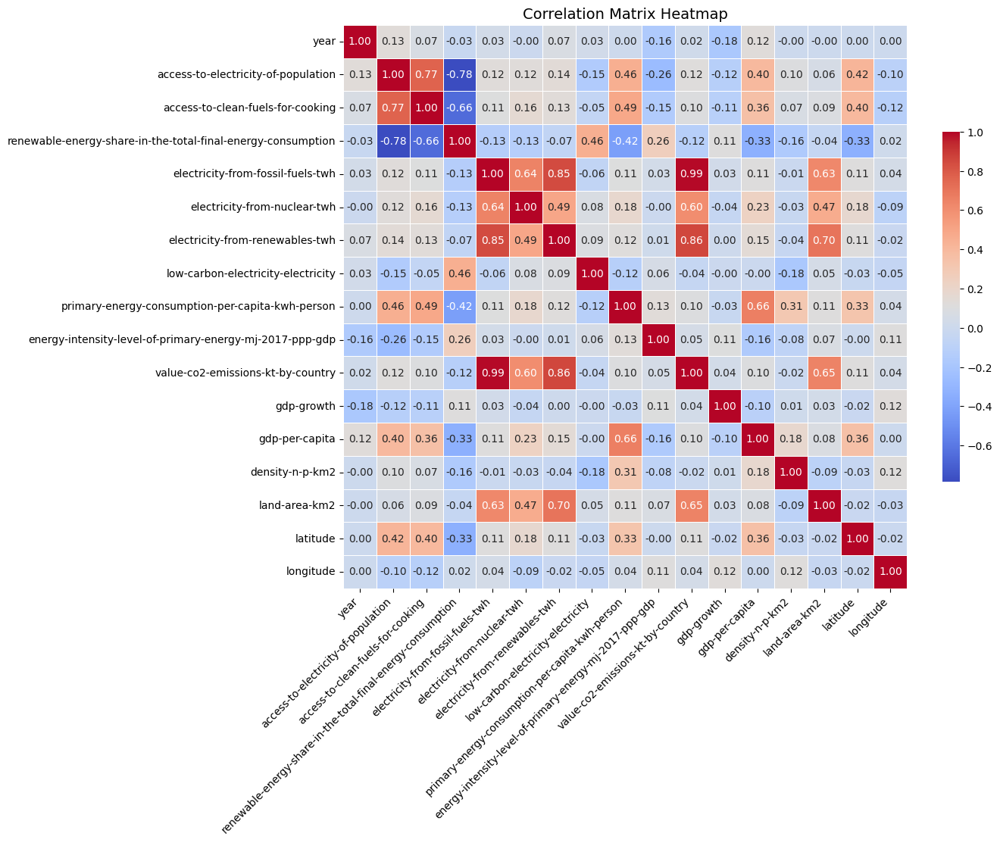

In [ ]:
correlation_heatmap(knn_df)

* **Random Forest Imputation**

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

def random_forest_impute(df):
    # Identify categorical columns
    categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

    # Apply LabelEncoder to categorical columns
    label_encoders = {}
    for col in categorical_cols:
        label_encoders[col] = LabelEncoder()
        df[col] = label_encoders[col].fit_transform(df[col])
    print('Encoded categorical columns completed!')

    # Imputation
    imputer = IterativeImputer(estimator=RandomForestRegressor(n_estimators=30))
    imputed_df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
    print('Imputation completed!')

    # Decode categorical columns after imputation
    # Inverse transform categorical columns back to their original categories
    for col in categorical_cols:
        imputed_df[col] = label_encoders[col].inverse_transform(imputed_df[col].astype(int))
    print('Decoded categorical columns completed!')

    return imputed_df

In [ ]:
rf_df = df_energy_clean.copy()
summary_null_data(rf_df)

,Null Values,Percentage Missing
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,186,5.10%
value-co2-emissions-kt-by-country,176,4.82%
renewable-energy-share-in-the-total-final-energy-consumption,173,4.74%
gdp-growth,86,2.36%
gdp-per-capita,51,1.40%
access-to-electricity-of-population,10,0.27%
longitude,1,0.03%
access-to-clean-fuels-for-cooking,1,0.03%
latitude,1,0.03%
land-area-km2,1,0.03%


In [ ]:
rf_df = random_forest_impute(rf_df)
summary_null_data(rf_df)

Encoded categorical columns completed!


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Imputation completed!
Decoded categorical columns completed!


/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.



,Null Values,Percentage Missing
country,0,0.00%
year,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%
primary-energy-consumption-per-capita-kwh-person,0,0.00%


In [ ]:
multiplot_co2(rf_df)
multiplot_energy(rf_df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



### **2.5. Duplicates**

In [ ]:
#Checking for duplicates
knn_df.duplicated().sum()
print('There are {} duplicated rows'.format(knn_df.duplicated().sum()))

There are 0 duplicated rows


### **2.6. Outliers**

#### **2.6.1. Outliers on CO2 Emission by Country**

In [ ]:
# Function to detect outliers using IQR
def detect_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    return ((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR)))

In [ ]:
outliers_summary = {}

# Analyze outliers for the specific column across countries and years
column = 'value-co2-emissions-kt-by-country'
for country in knn_df['country'].unique():
    for year in knn_df['year'].unique():
        segment = knn_df[(knn_df['country'] == country) & (knn_df['year'] == year)]
        outliers = detect_outliers(segment[column])
        outliers_count = outliers.sum()
        if outliers_count > 0:
            outliers_summary[(country, year)] = outliers_count

# Print summary of outliers
print(f"Summary of Outliers Detected in {column}:")
for key, value in outliers_summary.items():
    print(f"{key[0]} - {key[1]}: {value} outliers")

Summary of Outliers Detected in value-co2-emissions-kt-by-country:


In [ ]:
average_co2_per_country = knn_df.groupby('country')['value-co2-emissions-kt-by-country'].mean()
# Getting the top 5 countries with the highest average CO2 emissions
top_5_countries = average_co2_per_country.nlargest(5)
# Extracting only the country names as an array
country_names_array = top_5_countries.index.to_numpy()
# Filter the DataFrame for the top 5 countries
filtered_df = knn_df[knn_df['country'].isin(country_names_array)]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



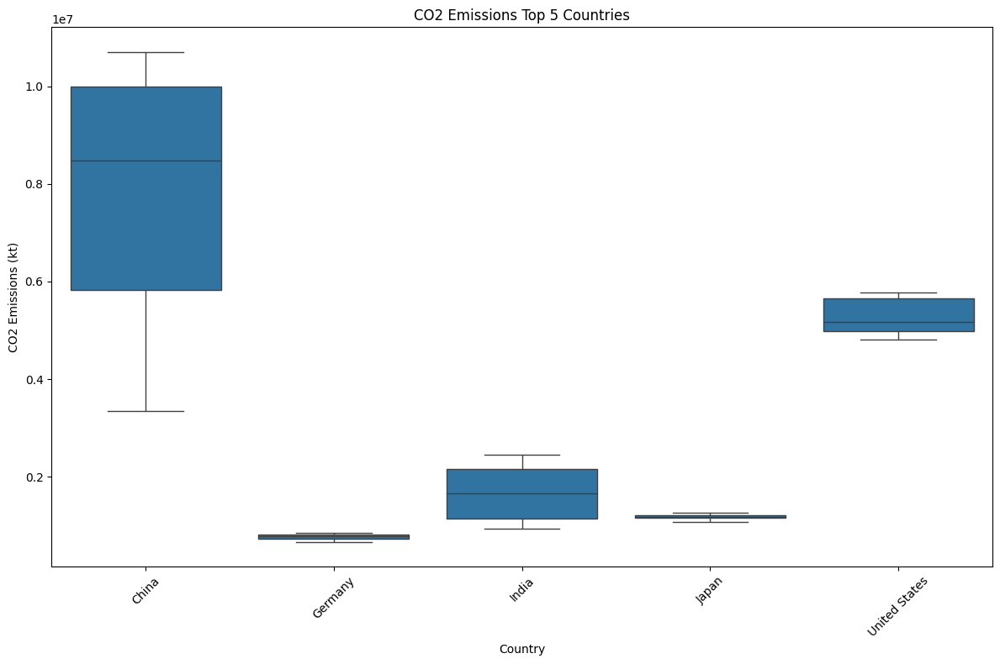

In [ ]:
# Create separate box plots for CO2 emissions per country
plt.figure(figsize=(12, 8))
sns.boxplot(x='country', y='value-co2-emissions-kt-by-country', data=filtered_df)
plt.title('CO2 Emissions Top 5 Countries')
plt.xlabel('Country')
plt.ylabel('CO2 Emissions (kt)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
average_co2_per_country = knn_df.groupby('country')['value-co2-emissions-kt-by-country'].mean()
# Filtering out countries with average CO2 emissions greater than 0
non_zero_countries = average_co2_per_country[average_co2_per_country > 0]
# Getting the top 5 countries with the highest average CO2 emissions
top_5_countries = non_zero_countries.nsmallest(5)
country_names_array = top_5_countries.index.to_numpy()
# Filter the DataFrame for the top 5 countries
filtered_df = knn_df[knn_df['country'].isin(country_names_array)]

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



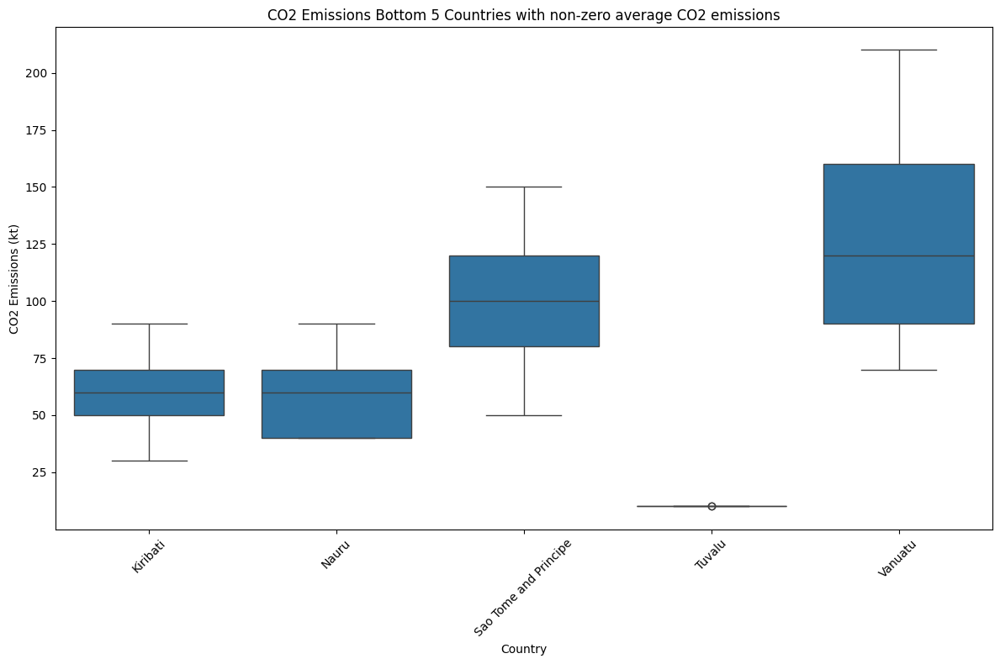

In [ ]:
# Create separate box plots for CO2 emissions per country
plt.figure(figsize=(12, 8))
sns.boxplot(x='country', y='value-co2-emissions-kt-by-country', data=filtered_df)
plt.title('CO2 Emissions Bottom 5 Countries with non-zero average CO2 emissions')
plt.xlabel('Country')
plt.ylabel('CO2 Emissions (kt)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### **2.6.2. Outliers on Energy Consumption**

In [ ]:
average_co2_per_country = knn_df.groupby('country')['primary-energy-consumption-per-capita-kwh-person'].mean()
# Getting the top 5 countries with the highest average CO2 emissions
top_5_countries = average_co2_per_country.nlargest(5)
# Extracting only the country names as an array
country_names_array = top_5_countries.index.to_numpy()
# Filter the DataFrame for the top 5 countries
filtered_df = knn_df[knn_df['country'].isin(country_names_array)]

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



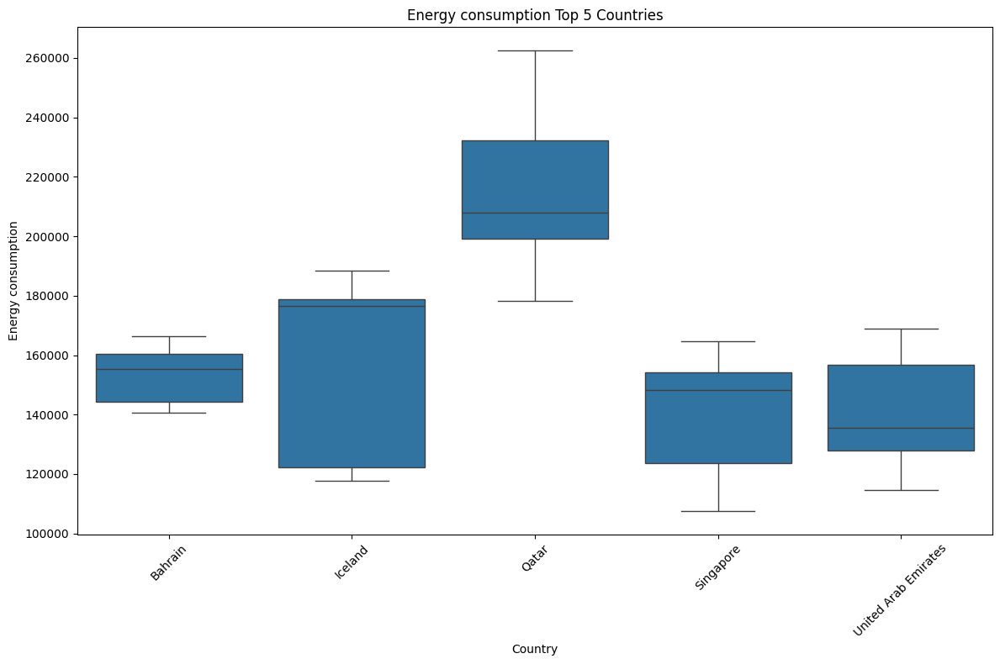

In [ ]:
# Create separate box plots for CO2 emissions per country
plt.figure(figsize=(12, 8))
sns.boxplot(x='country', y='primary-energy-consumption-per-capita-kwh-person', data=filtered_df)
plt.title('Energy consumption Top 5 Countries')
plt.xlabel('Country')
plt.ylabel('Energy consumption')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



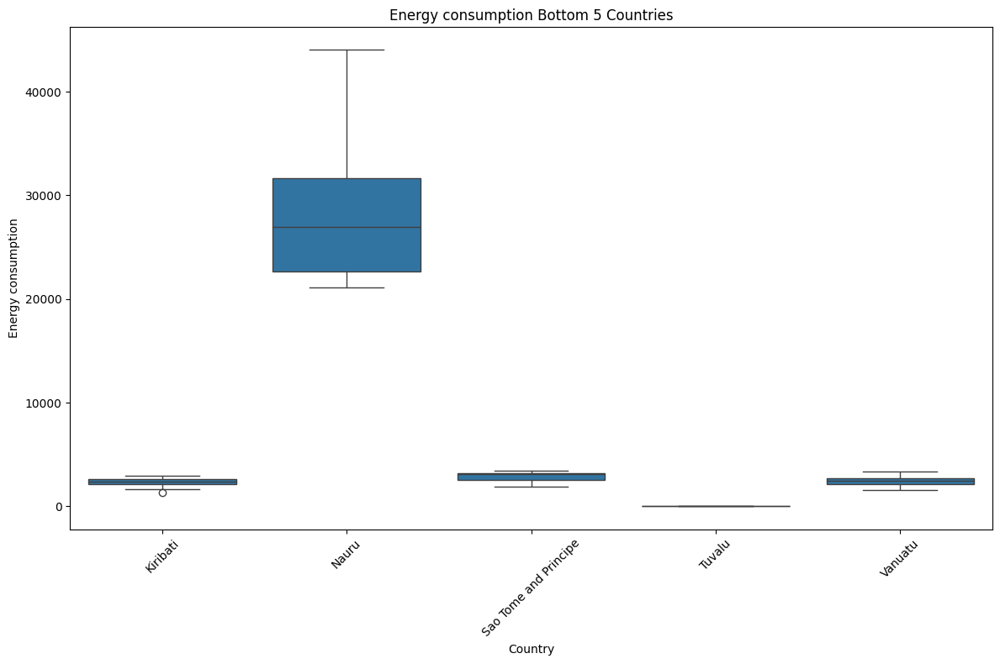

In [ ]:
average_co2_per_country = knn_df.groupby('country')['value-co2-emissions-kt-by-country'].mean()
# Filtering out countries with average CO2 emissions greater than 0
non_zero_countries = average_co2_per_country[average_co2_per_country > 0]
# Getting the top 5 countries with the highest average CO2 emissions
top_5_countries = non_zero_countries.nsmallest(5)
country_names_array = top_5_countries.index.to_numpy()
# Filter the DataFrame for the top 5 countries
filtered_df = knn_df[knn_df['country'].isin(country_names_array)]
# Create separate box plots for CO2 emissions per country
plt.figure(figsize=(12, 8))
sns.boxplot(x='country', y='primary-energy-consumption-per-capita-kwh-person', data=filtered_df)
plt.title('Energy consumption Bottom 5 Countries')
plt.xlabel('Country')
plt.ylabel('Energy consumption')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### **2.7. Data Integration**

In [ ]:
df_world_bank_den = pd.read_excel('country_density_per_year.xlsx')
df_world_bank_den.head()

,Country Name,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,495.005556,503.838889,509.894444,515.005556,519.666667,524.905556,531.144444,537.705556,544.422222,...,562.711111,567.288889,571.555556,575.522222,579.205556,582.633333,585.772222,588.677778,591.344444,592.138889
1,Africa Eastern and Southern,27.560480,28.274285,29.011282,29.770729,30.249713,31.056148,31.895464,32.771564,33.678052,...,36.531852,37.219640,38.254520,39.316203,40.417928,41.520571,42.623255,43.769082,44.946930,46.150813
2,Afghanistan,29.963329,30.186640,32.197624,34.719547,36.112339,37.427274,39.009159,39.714979,40.518221,...,44.844851,46.711251,48.359028,50.160542,51.750915,53.104284,54.648541,56.248231,57.908252,59.752281
3,Africa Western and Central,29.805268,30.639712,31.501133,32.388357,33.304507,34.250759,35.221007,36.217202,37.243205,...,40.514937,41.654561,42.804993,43.982443,45.180225,46.405991,47.661860,48.934069,50.222984,51.536679
4,Angola,13.149966,13.589145,14.050003,14.537854,15.056650,15.601956,16.172568,16.772025,17.399151,...,19.458660,20.203972,20.972970,21.760116,22.561740,23.385535,24.230872,25.085051,25.951382,26.813577


In [ ]:
df_data = pd.DataFrame(df_world_bank_den)

# Melt the DataFrame to transform the year columns into rows
melted_df = pd.melt(df_data, id_vars='Country Name', var_name='Year', value_name='density_info')

# Convert 'Year' column to numeric (assuming it's string type)
melted_df['Year'] = melted_df['Year'].astype(int)

# Sort by country name and year in ascending order
sorted_df = melted_df.sort_values(by=['Country Name', 'Year'])
df_world_bank_den = sorted_df.copy()
df_world_bank_den.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Country Name,Year,density_info
2,Afghanistan,2000,29.963329
268,Afghanistan,2001,30.186640
534,Afghanistan,2002,32.197624
800,Afghanistan,2003,34.719547
1066,Afghanistan,2004,36.112339


In [ ]:
#Print the number of rows and columns
integration_df = knn_df.copy()
print('Original DS Rows in the dataset is {} and columns is {}'.format(integration_df.shape[0], integration_df.shape[1]))
df_world_bank_den.shape
print('WB density DS Rows in the dataset is {} and columns is {}'.format(df_world_bank_den.shape[0], df_world_bank_den.shape[1]))

Original DS Rows in the dataset is 3649 and columns is 18
WB density DS Rows in the dataset is 5586 and columns is 3


In [ ]:
#Change name of columns to merge
df_world_bank_den = df_world_bank_den.rename(columns={'Country Name': 'country', 'Year': 'year'})
df_world_bank_den.head()

,country,year,density_info
2,Afghanistan,2000,29.963329
268,Afghanistan,2001,30.186640
534,Afghanistan,2002,32.197624
800,Afghanistan,2003,34.719547
1066,Afghanistan,2004,36.112339


In [ ]:
merged_df = pd.merge(integration_df, df_world_bank_den[['country','year','density_info']], how='left',
                     left_on=['country', 'year'], right_on=['country', 'year'])
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3649 entries, 0 to 3648
Data columns (total 19 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   object 
 1   year                                                          3649 non-null   float64
 2   access-to-electricity-of-population                           3649 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3649 non-null   float64
 4   renewable-energy-share-in-the-total-final-energy-consumption  3649 non-null   float64
 5   electricity-from-fossil-fuels-twh                             3649 non-null   float64
 6   electricity-from-nuclear-twh                                  3649 non-null   float64
 7   electricity-from-renewables-twh                               3649 no

In [ ]:
summary_null_data(merged_df)

,Null Values,Percentage Missing
density_info,1,0.03%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%
longitude,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
country,0,0.00%


In [ ]:
multiplot_density(merged_df)
multiline_plot_px(merged_df, 'year', 'density_info', 'country', 'Interactive Multiline Plot of Density vs. Year')

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-17-a5c861377807>:8: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



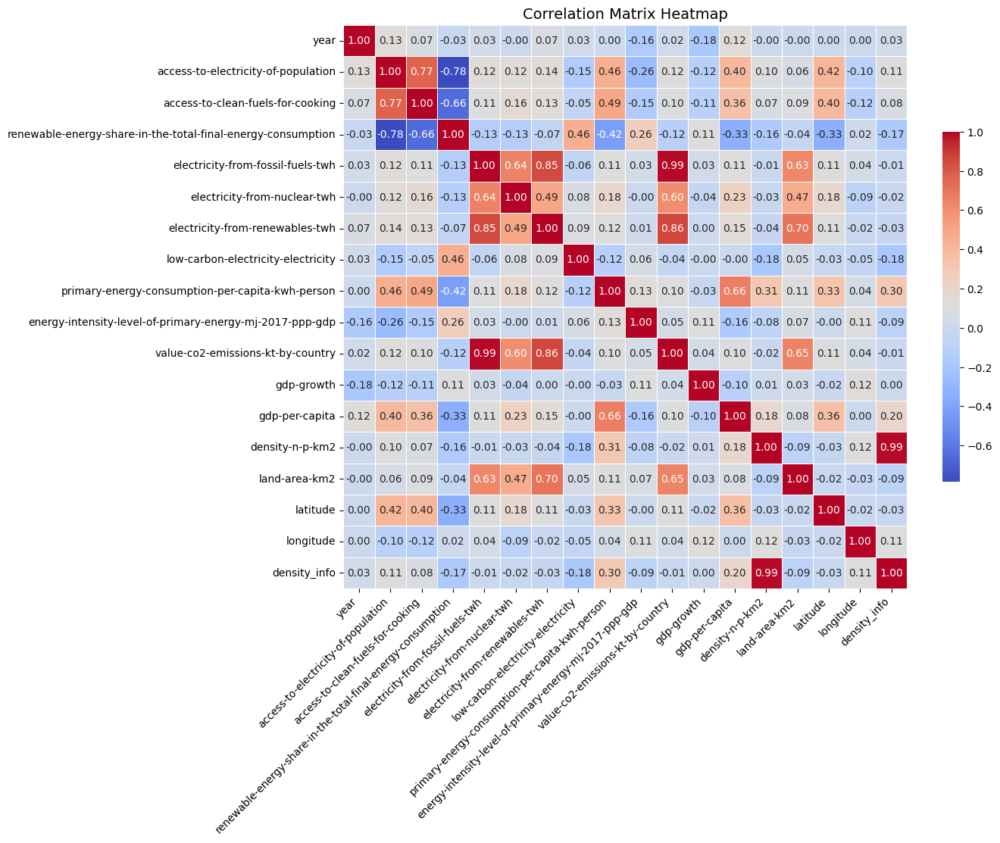

In [ ]:
correlation_heatmap(merged_df)

In [ ]:
df_bank_world_pop = pd.read_excel('country_population_per_year.xlsx')
df_bank_world_pop.head()

,country,2000,2001,2002,2003,2004,2005,2006,2007,2008,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aruba,89101.0,90691.0,91781.0,92701.0,93540.0,94483.0,95606.0,96787.0,97996.0,...,101288.0,102112.0,102880.0,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0
1,Africa Eastern and Southern,401600588.0,412001885.0,422741118.0,433807484.0,445281555.0,457153837.0,469508516.0,482406426.0,495748900.0,...,537792950.0,552530654.0,567892149.0,583651101.0,600008424.0,616377605.0,632746570.0,649757148.0,667242986.0,685112979.0
2,Afghanistan,19542982.0,19688632.0,21000256.0,22645130.0,23553551.0,24411191.0,25442944.0,25903301.0,26427199.0,...,29249157.0,30466479.0,31541209.0,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0
3,Africa Western and Central,269611898.0,277160097.0,284952322.0,292977949.0,301265247.0,309824829.0,318601484.0,327612838.0,336893835.0,...,366489204.0,376797999.0,387204553.0,397855507.0,408690375.0,419778384.0,431138704.0,442646825.0,454306063.0,466189102.0
4,Angola,16394062.0,16941587.0,17516139.0,18124342.0,18771125.0,19450959.0,20162340.0,20909684.0,21691522.0,...,24259111.0,25188292.0,26147002.0,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0


In [ ]:
df_data = pd.DataFrame(df_bank_world_pop)

# Melt the DataFrame to transform the year columns into rows
melted_df = pd.melt(df_data, id_vars='country', var_name='year', value_name='population')

# Convert 'Year' column to numeric (assuming it's string type)
melted_df['year'] = melted_df['year'].astype(int)

# Sort by country name and year in ascending order
sorted_df = melted_df.sort_values(by=['country', 'year'])
df_bank_world_pop = sorted_df.copy()
df_bank_world_pop.head()

,country,year,population
2,Afghanistan,2000,19542982.0
268,Afghanistan,2001,19688632.0
534,Afghanistan,2002,21000256.0
800,Afghanistan,2003,22645130.0
1066,Afghanistan,2004,23553551.0


In [ ]:
merged_pop_df = pd.merge(merged_df, df_bank_world_pop[['country','year','population']], how='left',
                     left_on=['country', 'year'], right_on=['country', 'year'])
merged_pop_df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,country,year,access-to-electricity-of-population,access-to-clean-fuels-for-cooking,renewable-energy-share-in-the-total-final-energy-consumption,electricity-from-fossil-fuels-twh,electricity-from-nuclear-twh,electricity-from-renewables-twh,low-carbon-electricity-electricity,primary-energy-consumption-per-capita-kwh-person,energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,value-co2-emissions-kt-by-country,gdp-growth,gdp-per-capita,density-n-p-km2,land-area-km2,latitude,longitude,density_info,population
0,Afghanistan,2000.0,1.613591,6.2,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,2.631765,302.518841,60.0,652230.0,33.93911,67.709953,29.963329,19542982.0
1,Afghanistan,2001.0,4.074574,7.2,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,2.631765,193.830823,60.0,652230.0,33.93911,67.709953,30.186640,19688632.0
2,Afghanistan,2002.0,9.409158,8.2,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,7.158704,179.426579,60.0,652230.0,33.93911,67.709953,32.197624,21000256.0
3,Afghanistan,2003.0,14.738506,9.5,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,8.832278,190.683814,60.0,652230.0,33.93911,67.709953,34.719547,22645130.0
4,Afghanistan,2004.0,20.064968,10.9,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,1.414118,211.382074,60.0,652230.0,33.93911,67.709953,36.112339,23553551.0


In [ ]:
summary_null_data(merged_pop_df)

,Null Values,Percentage Missing
population,1,0.03%
density_info,1,0.03%
year,0,0.00%
longitude,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%


In [ ]:
multiline_plot_px(merged_pop_df, 'year', 'population', 'country', 'Interactive Multiline Plot of Population vs. Year')

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



<ipython-input-17-a5c861377807>:8: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



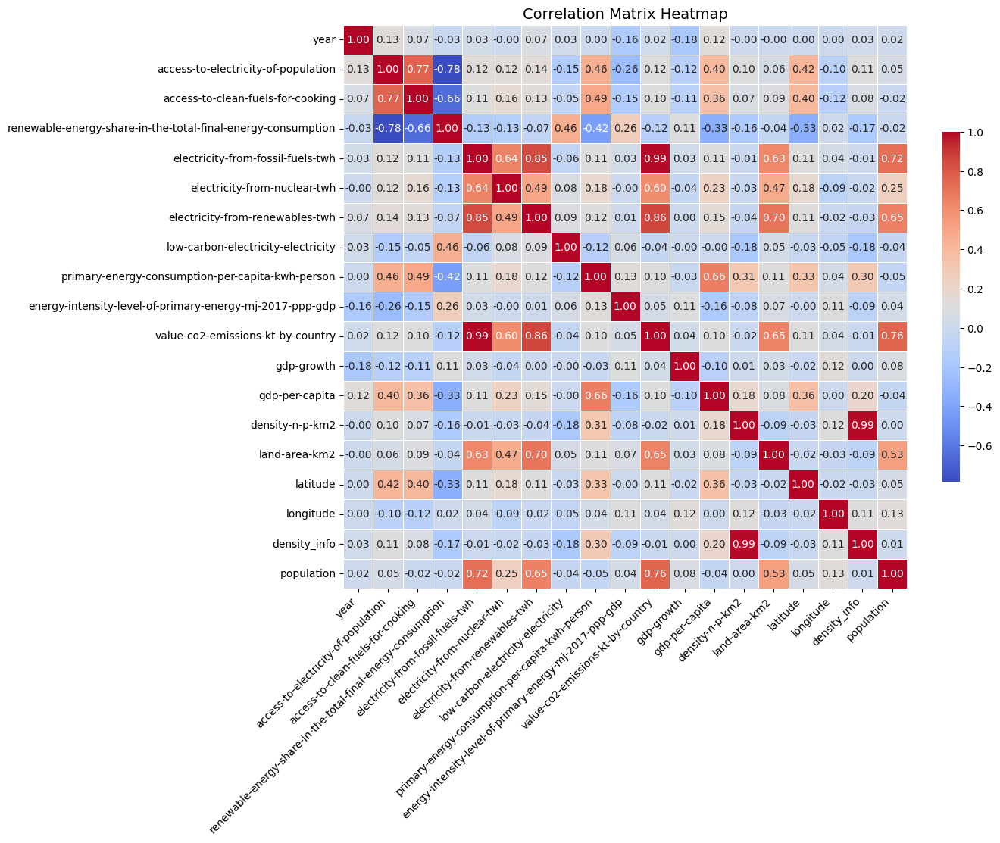

In [ ]:
correlation_heatmap(merged_pop_df)

### **2.8. Data Transformation**

* **Rectifying Density column**

In [ ]:
# This line will replace values in 'density-p-km2' only where 'density_info' is not null
merged_pop_df['density-n-p-km2'] = np.where(merged_pop_df['density_info'].notna(),
                                          merged_pop_df['density_info'],
                                          merged_pop_df['density-n-p-km2'])
#Drop density_info column
merged_pop_df = merged_pop_df.drop(columns=['density_info'])
summary_null_data(merged_pop_df)

,Null Values,Percentage Missing
population,1,0.03%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%
longitude,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
country,0,0.00%


* **Creating Energy consumption per country column**

In [ ]:
# Impute the last missing values
# Identifying the row with the missing 'population' value
missing_index = merged_pop_df[merged_pop_df['population'].isna()].index

# Assuming there's only one missing value, calculate the product of 'density' and 'land'
if len(missing_index) == 1:
    index = missing_index[0]
    merged_pop_df.at[index, 'population'] = merged_pop_df.at[index, 'density-n-p-km2'] * merged_pop_df.at[index, 'land-area-km2']
else:
    print("More than one missing value found or no missing values.")
summary_null_data(merged_pop_df)
merged_pop_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3649 entries, 0 to 3648
Data columns (total 19 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   object 
 1   year                                                          3649 non-null   float64
 2   access-to-electricity-of-population                           3649 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3649 non-null   float64
 4   renewable-energy-share-in-the-total-final-energy-consumption  3649 non-null   float64
 5   electricity-from-fossil-fuels-twh                             3649 non-null   float64
 6   electricity-from-nuclear-twh                                  3649 non-null   float64
 7   electricity-from-renewables-twh                               3649 no

In [ ]:
merged_pop_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3649 entries, 0 to 3648
Data columns (total 19 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   object 
 1   year                                                          3649 non-null   float64
 2   access-to-electricity-of-population                           3649 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3649 non-null   float64
 4   renewable-energy-share-in-the-total-final-energy-consumption  3649 non-null   float64
 5   electricity-from-fossil-fuels-twh                             3649 non-null   float64
 6   electricity-from-nuclear-twh                                  3649 non-null   float64
 7   electricity-from-renewables-twh                               3649 no

In [ ]:
# Create a new column for primary energy consumption per country
merged_pop_df['primary-energy-consumption-kwh'] = merged_pop_df['primary-energy-consumption-per-capita-kwh-person'] * merged_pop_df['population']
# Convert the primary energy consumption column from KWH to TWH
merged_pop_df['primary-energy-consumption-twh'] = merged_pop_df['primary-energy-consumption-kwh'] / 1000000000
# Drop the primary energy consumption per capita KWH column
merged_pop_df = merged_pop_df.drop(columns=['primary-energy-consumption-kwh','primary-energy-consumption-per-capita-kwh-person'])
merged_pop_df.head()

,country,year,access-to-electricity-of-population,access-to-clean-fuels-for-cooking,renewable-energy-share-in-the-total-final-energy-consumption,electricity-from-fossil-fuels-twh,electricity-from-nuclear-twh,electricity-from-renewables-twh,low-carbon-electricity-electricity,energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,value-co2-emissions-kt-by-country,gdp-growth,gdp-per-capita,density-n-p-km2,land-area-km2,latitude,longitude,population,primary-energy-consumption-twh
0,Afghanistan,2000.0,1.613591,6.2,44.99,0.16,0.0,0.31,65.957440,1.64,760.000000,2.631765,302.518841,29.963329,652230.0,33.93911,67.709953,19542982.0,5.913605
1,Afghanistan,2001.0,4.074574,7.2,45.60,0.09,0.0,0.50,84.745766,1.74,730.000000,2.631765,193.830823,30.186640,652230.0,33.93911,67.709953,19688632.0,4.664076
2,Afghanistan,2002.0,9.409158,8.2,37.83,0.13,0.0,0.56,81.159424,1.40,1029.999971,7.158704,179.426579,32.197624,652230.0,33.93911,67.709953,21000256.0,4.428159
3,Afghanistan,2003.0,14.738506,9.5,36.66,0.31,0.0,0.63,67.021280,1.40,1220.000029,8.832278,190.683814,34.719547,652230.0,33.93911,67.709953,22645130.0,5.207660
4,Afghanistan,2004.0,20.064968,10.9,44.24,0.33,0.0,0.56,62.921350,1.20,1029.999971,1.414118,211.382074,36.112339,652230.0,33.93911,67.709953,23553551.0,4.810371


In [ ]:
merged_pop_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3649 entries, 0 to 3648
Data columns (total 19 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   object 
 1   year                                                          3649 non-null   float64
 2   access-to-electricity-of-population                           3649 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3649 non-null   float64
 4   renewable-energy-share-in-the-total-final-energy-consumption  3649 non-null   float64
 5   electricity-from-fossil-fuels-twh                             3649 non-null   float64
 6   electricity-from-nuclear-twh                                  3649 non-null   float64
 7   electricity-from-renewables-twh                               3649 no

In [ ]:
multiline_plot_px(merged_pop_df, 'year', 'primary-energy-consumption-twh', 'country', 'Interactive Multiline Plot of Energy Consumption vs. Year')

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



In [ ]:
# Group countries to get the count of years for which data is available
grouped_df = merged_pop_df.groupby('country').count()
# Get the countries with 21 years of data
countries_with_21_years = grouped_df[grouped_df['year'] == 21].index.tolist()
# Get the number of counties with 21 years of data
print(f"There are {len(countries_with_21_years)} countries with 21 years of data.")
# Get the countries under 21 years of data
countries_under_21_years = grouped_df[grouped_df['year'] < 21].index.tolist()
countries_under_21_years
# Get the number of counties with 21 years of data
print(f"There are {len(countries_under_21_years)} countries under 21 years of data.")

There are 172 countries with 21 years of data.
There are 4 countries under 21 years of data.


In [ ]:
import pandas as pd

# Assuming merged_pop_df is your DataFrame containing country and year data

# Group countries to get the count of years for which data is available
grouped_df = merged_pop_df.groupby('country').count()

# Get the countries with less than 21 years of data
countries_under_21_years = grouped_df[grouped_df['year'] < 21].index.tolist()

# Determine the full range of years in the dataset
all_years = set(merged_pop_df['year'].unique())

# Function to find missing years for a country
def find_missing_years(country):
    country_years = set(merged_pop_df[merged_pop_df['country'] == country]['year'])
    missing_years = all_years - country_years
    return sorted(missing_years)

# Apply the function to each country with less than 21 years of data and store the results
countries_missing_years = {country: find_missing_years(country) for country in countries_under_21_years}

# Print the missing years for each country with less than 21 years of data
for country, missing_years in countries_missing_years.items():
    print(f"{country} is missing the years: {missing_years}")


French Guiana is missing the years: [2001.0, 2002.0, 2003.0, 2004.0, 2005.0, 2006.0, 2007.0, 2008.0, 2009.0, 2010.0, 2011.0, 2012.0, 2013.0, 2014.0, 2015.0, 2016.0, 2017.0, 2018.0, 2019.0, 2020.0]
Montenegro is missing the years: [2000.0, 2001.0, 2002.0, 2003.0, 2004.0, 2005.0, 2006.0]
Serbia is missing the years: [2000.0, 2001.0, 2002.0, 2003.0, 2004.0, 2005.0, 2006.0]
South Sudan is missing the years: [2000.0, 2001.0, 2002.0, 2003.0, 2004.0, 2005.0, 2006.0, 2007.0, 2008.0, 2009.0, 2010.0, 2011.0, 2012.0]


In [ ]:
!pip install geopy

In [ ]:
import requests
from urllib.parse import urlencode

def get_region_from_country(country_name):
    # First, geocode the country name to get its coordinates
    geocode_params = {
        'format': 'json',
        'q': country_name
    }
    geocode_response = requests.get(f"https://nominatim.openstreetmap.org/search?{urlencode(geocode_params)}")
    if geocode_response.status_code != 200 or not geocode_response.json():
        return 'Unknown'

    geocode_data = geocode_response.json()[0]
    lat, lon = geocode_data['lat'], geocode_data['lon']

    # Then, reverse geocode the coordinates to get the region
    reverse_params = {
        'format': 'json',
        'lat': lat,
        'lon': lon
    }
    reverse_response = requests.get(f"https://nominatim.openstreetmap.org/reverse?{urlencode(reverse_params)}")
    if reverse_response.status_code == 200:
        reverse_data = reverse_response.json()
        return reverse_data.get('address', {}).get('state', 'Unknown')
    else:
        return 'Unknown'

In [ ]:
country = "French Guiana"
region = get_region_from_country(country)
print(f"Region for {country}: {region}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Region for French Guiana: Guyane


* **Encoding categorical variables**

In [ ]:
# Encode categorical values
from sklearn.preprocessing import LabelEncoder

# Define a global variable
label_encoders = {}

# Define a method to handle categorical encoding
def encode_categorical_columns(dataframe):
    global label_encoders  # Access the global variable

    # Identify categorical columns
    categorical_cols = dataframe.select_dtypes(include=['object']).columns.tolist()

    # Apply LabelEncoder to categorical columns
    for col in categorical_cols:
        if col not in label_encoders:
            label_encoders[col] = LabelEncoder()
            dataframe[col] = label_encoders[col].fit_transform(dataframe[col])
        else:
            dataframe[col] = label_encoders[col].transform(dataframe[col])

* **Decode categorical variables**

In [ ]:
# Assuming you already have label_encoders as a global variable holding the encoders
def decode_categorical_columns(dataframe):
    global label_encoders  # Access the global variable

    # Iterate through categorical columns and decode values
    for col, encoder in label_encoders.items():
        if col in dataframe.columns:
            dataframe[col] = encoder.inverse_transform(dataframe[col])

In [ ]:
encoded_df = merged_pop_df.copy()
encode_categorical_columns(encoded_df)

In [ ]:
encoded_df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,country,year,access-to-electricity-of-population,access-to-clean-fuels-for-cooking,renewable-energy-share-in-the-total-final-energy-consumption,electricity-from-fossil-fuels-twh,electricity-from-nuclear-twh,electricity-from-renewables-twh,low-carbon-electricity-electricity,energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,value-co2-emissions-kt-by-country,gdp-growth,gdp-per-capita,density-n-p-km2,land-area-km2,latitude,longitude,population,primary-energy-consumption-twh
0,0,2000.0,1.613591,6.2,44.99,0.16,0.0,0.31,65.957440,1.64,760.000000,2.631765,302.518841,29.963329,652230.0,33.93911,67.709953,19542982.0,5.913605
1,0,2001.0,4.074574,7.2,45.60,0.09,0.0,0.50,84.745766,1.74,730.000000,2.631765,193.830823,30.186640,652230.0,33.93911,67.709953,19688632.0,4.664076
2,0,2002.0,9.409158,8.2,37.83,0.13,0.0,0.56,81.159424,1.40,1029.999971,7.158704,179.426579,32.197624,652230.0,33.93911,67.709953,21000256.0,4.428159
3,0,2003.0,14.738506,9.5,36.66,0.31,0.0,0.63,67.021280,1.40,1220.000029,8.832278,190.683814,34.719547,652230.0,33.93911,67.709953,22645130.0,5.207660
4,0,2004.0,20.064968,10.9,44.24,0.33,0.0,0.56,62.921350,1.20,1029.999971,1.414118,211.382074,36.112339,652230.0,33.93911,67.709953,23553551.0,4.810371


### **2.9. Feature scaling**

#### **2.6.1. Identify normal distribution for the main features**

In [ ]:
fig = px.histogram(merged_pop_df, x='primary-energy-consumption-twh', nbins=30) # nbins can be adjusted
fig.update_layout(title='Histogram of Feature', xaxis_title='Energy consumption per Country [TWH]', yaxis_title='Frecuency')
fig.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



In [ ]:
fig = px.histogram(merged_pop_df, x='value-co2-emissions-kt-by-country', nbins=30) # nbins can be adjusted
fig.update_layout(title='Histogram of Feature', xaxis_title='CO2 emission by Country', yaxis_title='Frecuency')
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



#### **2.6.2. Scaling methods**

In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import pandas as pd

def scale_data(df, method='standardization'):
    """
    Scale the data using either Min-Max Normalization or Standardization.

    Parameters:
    df (pd.DataFrame): DataFrame containing the data to be scaled.
    method (str): The scaling method to use ('normalization' or 'standardization').

    Returns:
    pd.DataFrame: Scaled DataFrame.
    """

    if method == 'normalization':
        scaler = MinMaxScaler()
    elif method == 'standardization':
        scaler = StandardScaler()
    else:
        raise ValueError("Method should be either 'normalization' or 'standardization'")

    scaled_data = scaler.fit_transform(df)
    scaled_df = pd.DataFrame(scaled_data, columns=df.columns)

    return scaled_df

In [ ]:
# Select the columns to scale all but country column
columns_to_scale = encoded_df.columns[(encoded_df.columns != 'country') & (encoded_df.columns != 'year')]

df_col_scale = encoded_df.copy()
df_col_scale[columns_to_scale]
#Performing the Normalization
df_col_scale[columns_to_scale] = scale_data(df_col_scale[columns_to_scale], method='normalization')

In [ ]:
df_col_scale[columns_to_scale]
## Add the country column back to the DataFrame
df_col_scale['country'] = encoded_df['country']
df_col_scale.head()

,country,year,access-to-electricity-of-population,access-to-clean-fuels-for-cooking,renewable-energy-share-in-the-total-final-energy-consumption,electricity-from-fossil-fuels-twh,electricity-from-nuclear-twh,electricity-from-renewables-twh,low-carbon-electricity-electricity,energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,value-co2-emissions-kt-by-country,gdp-growth,gdp-per-capita,density-n-p-km2,land-area-km2,latitude,longitude,population,primary-energy-consumption-twh
0,0,2000.0,0.003659,0.062,0.468451,0.000031,0.0,0.000142,0.659574,0.050353,0.000071,0.349364,0.002449,0.003563,0.065321,0.706944,0.687612,0.013843,0.000144
1,0,2001.0,0.028581,0.072,0.474802,0.000017,0.0,0.000229,0.847458,0.053423,0.000068,0.349364,0.001569,0.003591,0.065321,0.706944,0.687612,0.013946,0.000113
2,0,2002.0,0.082603,0.082,0.393898,0.000025,0.0,0.000256,0.811594,0.042984,0.000096,0.373806,0.001453,0.003844,0.065321,0.706944,0.687612,0.014875,0.000108
3,0,2003.0,0.136573,0.095,0.381716,0.000060,0.0,0.000288,0.670213,0.042984,0.000114,0.382842,0.001544,0.004161,0.065321,0.706944,0.687612,0.016041,0.000127
4,0,2004.0,0.190513,0.109,0.460641,0.000064,0.0,0.000256,0.629213,0.036844,0.000096,0.342790,0.001711,0.004335,0.065321,0.706944,0.687612,0.016685,0.000117


In [ ]:
multiline_plot_px(df_col_scale, 'year', 'primary-energy-consumption-twh', 'country', 'Interactive Multiline Plot of Energy Consumption vs. Year')
multiplot_co2(df_col_scale)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



### **2.10. Feature Selection**

#### **2.10.1. Filter method**

In [ ]:
feat_select_df = df_col_scale.copy()
summary_null_data(feat_select_df)

,Null Values,Percentage Missing
country,0,0.00%
value-co2-emissions-kt-by-country,0,0.00%
population,0,0.00%
longitude,0,0.00%
latitude,0,0.00%
land-area-km2,0,0.00%
density-n-p-km2,0,0.00%
gdp-per-capita,0,0.00%
gdp-growth,0,0.00%
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp,0,0.00%


In [ ]:
import pandas as pd

# Assuming 'df' is your DataFrame and 'column_of_interest' is the column you are focusing on
# Calculate the correlation matrix
corr_matrix = feat_select_df.corr()

column_of_interest = 'value-co2-emissions-kt-by-country'
# Define a threshold for high correlation (e.g., 0.8)
threshold = 0.4

# Get the correlations of the column of interest
correlations = corr_matrix[column_of_interest]

# Find columns with correlation above the threshold
highly_correlated_columns = correlations[abs(correlations) > threshold].index.tolist()

# Remove the column of interest from the list, if present
highly_correlated_columns.remove(column_of_interest)

# Print the highly correlated columns
print(f"Columns highly correlated with '{column_of_interest}': {highly_correlated_columns}")


Columns highly correlated with 'value-co2-emissions-kt-by-country': ['electricity-from-fossil-fuels-twh', 'electricity-from-nuclear-twh', 'electricity-from-renewables-twh', 'land-area-km2', 'population', 'primary-energy-consumption-twh']


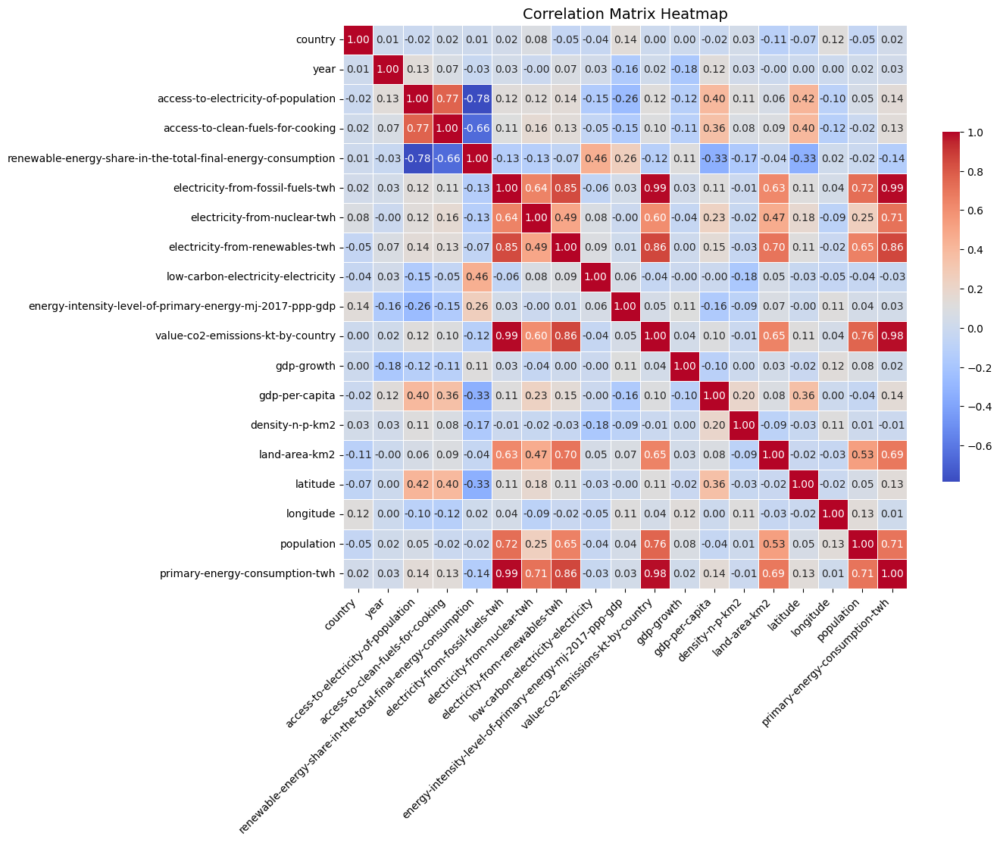

In [ ]:
correlation_heatmap(feat_select_df)

#### **2.10.2. Wrapper method**

In [ ]:
df_col_scale.isnull().sum()

country                                                         0
year                                                            0
access-to-electricity-of-population                             0
access-to-clean-fuels-for-cooking                               0
renewable-energy-share-in-the-total-final-energy-consumption    0
electricity-from-fossil-fuels-twh                               0
electricity-from-nuclear-twh                                    0
electricity-from-renewables-twh                                 0
low-carbon-electricity-electricity                              0
energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp        0
value-co2-emissions-kt-by-country                               0
gdp-growth                                                      0
gdp-per-capita                                                  0
density-n-p-km2                                                 0
land-area-km2                                                   0
latitude  

In [ ]:
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = df_col_scale.drop(columns=target_columns)
targets = df_col_scale[target_columns]
X_fs = df_col_scale[features.columns]
Y_fs = df_col_scale[targets.columns]

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFE
# Create a Random Forest Regressor model instance
model = RandomForestRegressor()
rfe = RFE(model, n_features_to_select= 11)
# Dictionary to store the selected features for each target
selected_features_dict = {}
# Loop for Y_fs (targets)
for col in Y_fs.columns:
    print(f"Processing: {col}")
    # Determine which columns are not being processed in this iteration
    skipped_columns = [c for c in Y_fs.columns if c != col]
    print(f"Skipped Columns: {skipped_columns}")
    # Create a temporary DataFrame that includes the skipped columns
    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    try:
        fit = rfe.fit(temp_X_fs, Y_fs[col])
        # Print the results
        print(f"Number of Features Selected: {fit.n_features_}")
        print(f"Feature Ranking: {fit.ranking_}")

        # Get the names of the selected features
        selected_features = temp_X_fs.columns[fit.support_ == 1]
        selected_features_dict[col] = selected_features
        print(f"Selected Features: {selected_features.tolist()}")
    except Exception as e:
        print(f"An error occurred on Feature selection process: {col}: {e}")

Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Number of Features Selected: 11
Feature Ranking: [6 2 4 1 1 1 5 1 1 1 3 1 1 1 7 8 1 1]
Selected Features: ['access-to-clean-fuels-for-cooking', 'renewable-energy-share-in-the-total-final-energy-consumption', 'electricity-from-fossil-fuels-twh', 'electricity-from-renewables-twh', 'low-carbon-electricity-electricity', 'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp', 'gdp-per-capita', 'density-n-p-km2', 'land-area-km2', 'population', 'primary-energy-consumption-twh']
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Number of Features Selected: 11
Feature Ranking: [3 6 1 1 1 1 1 1 1 1 4 2 1 5 7 8 1 1]
Selected Features: ['access-to-electricity-of-population', 'access-to-clean-fuels-for-cooking', 'renewable-energy-share-in-the-total-final-energy-consumption', 'electricity-from-fossil-fuels-twh', 'electricity-from-nuclear-twh', 'electricity-from-renewables-twh', 'low-carbon-electricity-electricity', 'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp', 'density-n-p-km2', 'population', 'value-co2-emissions-kt-by-country']


## **3. Model Selection**

## **Chronological Splitting**

#### **3.1. Linear Regression**

In [ ]:
df_col_scale['year'] = df_col_scale['year'].astype(int)
df_col_scale.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3649 entries, 0 to 3648
Data columns (total 19 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   country                                                       3649 non-null   int64  
 1   year                                                          3649 non-null   int64  
 2   access-to-electricity-of-population                           3649 non-null   float64
 3   access-to-clean-fuels-for-cooking                             3649 non-null   float64
 4   renewable-energy-share-in-the-total-final-energy-consumption  3649 non-null   float64
 5   electricity-from-fossil-fuels-twh                             3649 non-null   float64
 6   electricity-from-nuclear-twh                                  3649 non-null   float64
 7   electricity-from-renewables-twh                               3649 no

In [ ]:
linear_model_df = df_col_scale.copy()
average_co2_per_country = linear_model_df.groupby('country')['primary-energy-consumption-twh'].mean()
# Getting the top 5 countries with the highest average CO2 emissions
top_5_countries = average_co2_per_country.nlargest(5)
# Extracting only the country names as an array
country_names_array = top_5_countries.index.to_numpy()
# Filter the DataFrame for the top 5 countries
filtered_df = linear_model_df[linear_model_df['country'].isin(country_names_array)]

/usr/local/lib/python3.10/dist-packages/pandas/core/algorithms.py:522: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



In [ ]:
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = linear_model_df.drop(columns=target_columns)
targets = linear_model_df[target_columns]
X_fs = linear_model_df[features.columns]
Y_fs = linear_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = linear_model_df[linear_model_df['year'] <= 2016]
test_data = linear_model_df[linear_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
R2 Score: 0.979201889254254
Mean Absolute Error: 0.004495796403647071
Mean Squared Error: 0.00014295628888166554
Root Mean Squared Error: 0.011956432949741556
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'co

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

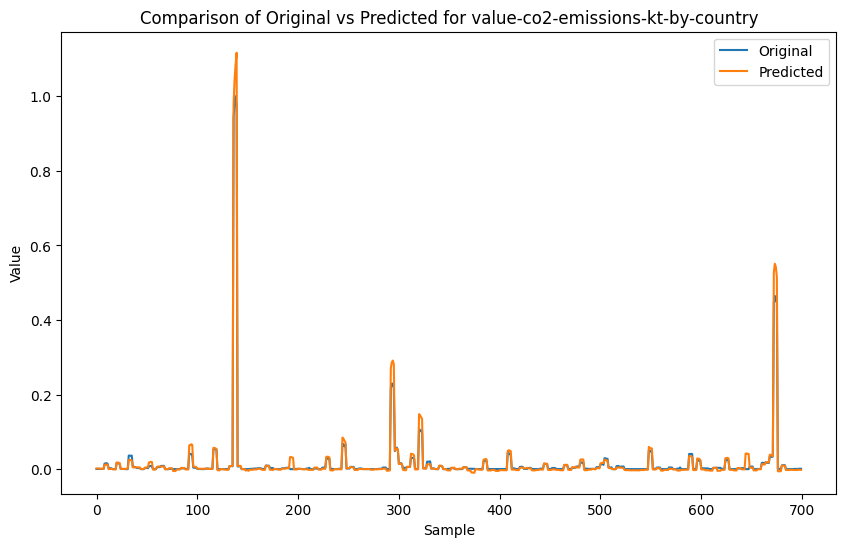

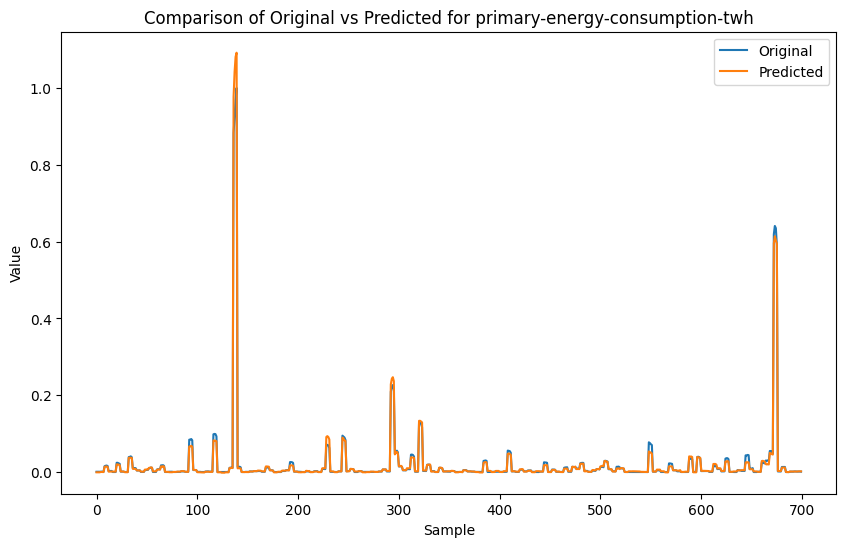

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, you can display the difference
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.2. Random Forest Regressor**

In [ ]:
random_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = random_model_df.drop(columns=target_columns)
targets = random_model_df[target_columns]
X_fs = random_model_df[features.columns]
Y_fs = random_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = random_model_df[random_model_df['year'] <= 2016]
test_data = random_model_df[random_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



R2 Score: 0.9874174215877914
Mean Absolute Error: 0.0019296821305506303
Mean Squared Error: 8.648663988577959e-05
Root Mean Squared Error: 0.009299819346943228
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'country',
       'population', 'access-to-electricity-of-population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'year',
       'value-co2-emissions-kt-by-country',
       'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



R2 Score: 0.9866691105386827
Mean Absolute Error: 0.0019166117808102992
Mean Squared Error: 0.0001019963274931118
Root Mean Squared Error: 0.01009932312054188


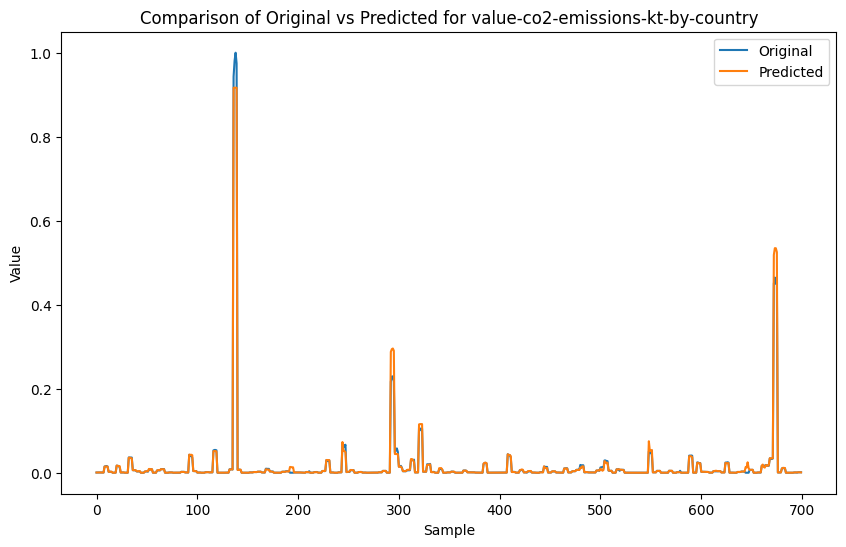

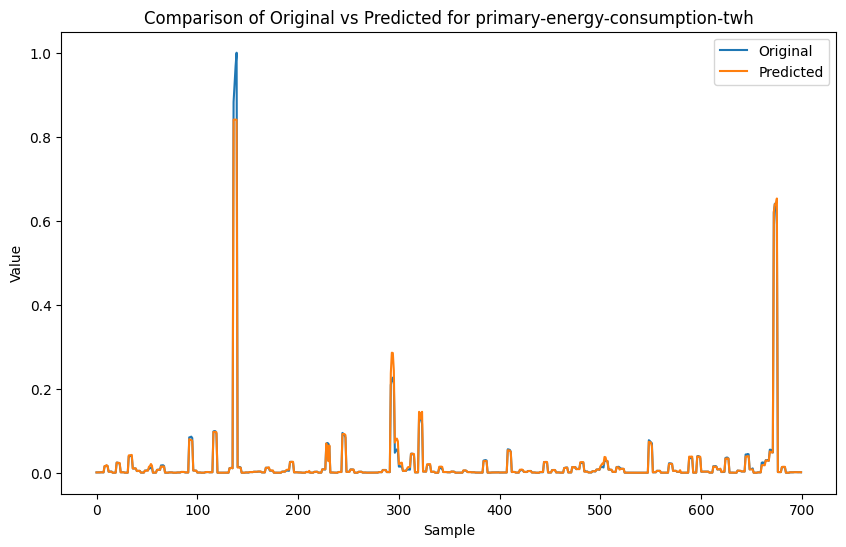

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import sklearn.metrics as metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import joblib
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

    # Save the model
    joblib.dump(model, f'random_forest_model_{target}.pkl')

# After processing all targets, display the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.3. SVR**

In [ ]:
svr_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = svr_model_df.drop(columns=target_columns)
targets = svr_model_df[target_columns]
X_fs = svr_model_df[features.columns]
Y_fs = svr_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = svr_model_df[svr_model_df['year'] <= 2016]
test_data = svr_model_df[svr_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
R2 Score: -1.0379008771481733
Mean Absolute Error: 0.09997659151589038
Mean Squared Error: 0.014007558189648666
Root Mean Squared Error: 0.11835353053309676
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'coun

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

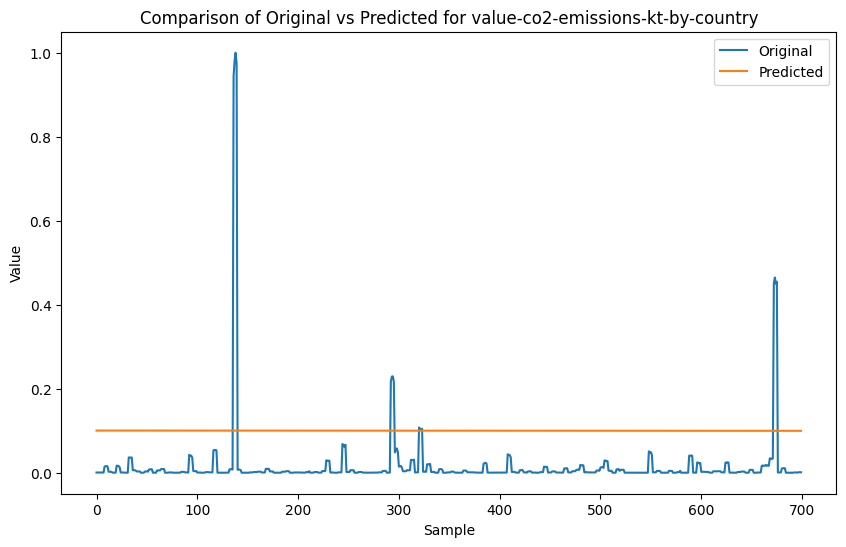

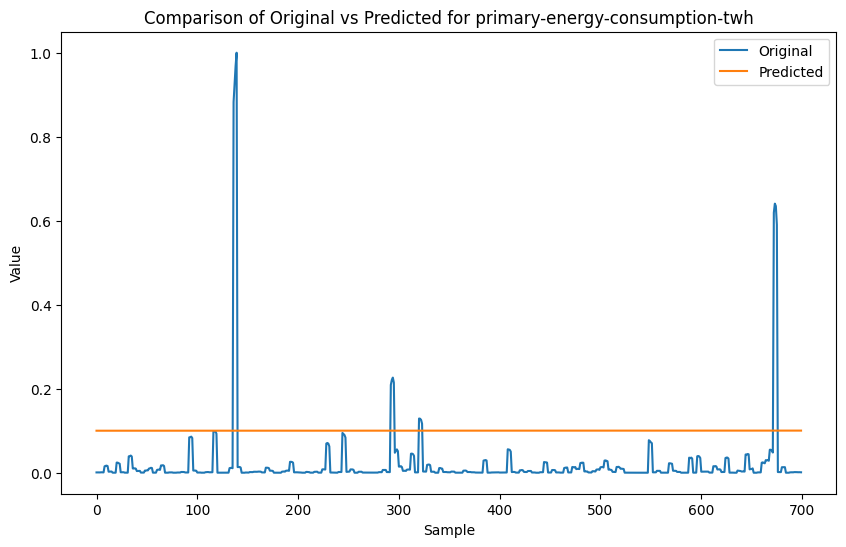

In [ ]:
from sklearn.svm import SVR
import sklearn.metrics as metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd

# Initialize a dictionary to store original and predicted values
results = {}

for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    model = SVR(kernel='rbf')
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.4. MLP regressor**

In [ ]:
mlp_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = mlp_model_df.drop(columns=target_columns)
targets = mlp_model_df[target_columns]
X_fs = mlp_model_df[features.columns]
Y_fs = mlp_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = mlp_model_df[mlp_model_df['year'] <= 2016]
test_data = mlp_model_df[mlp_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



R2 Score: 0.8196306294853442
Mean Absolute Error: 0.020690916157815598
Mean Squared Error: 0.0012397729847635967
Root Mean Squared Error: 0.03521041017602034
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'country',
       'population', 'access-to-electricity-of-population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'year',
       'value-co2-emissions-kt-by-country',
       'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



R2 Score: 0.9084769838087244
Mean Absolute Error: 0.018178227971192278
Mean Squared Error: 0.0007002542148211779
Root Mean Squared Error: 0.026462316883092037


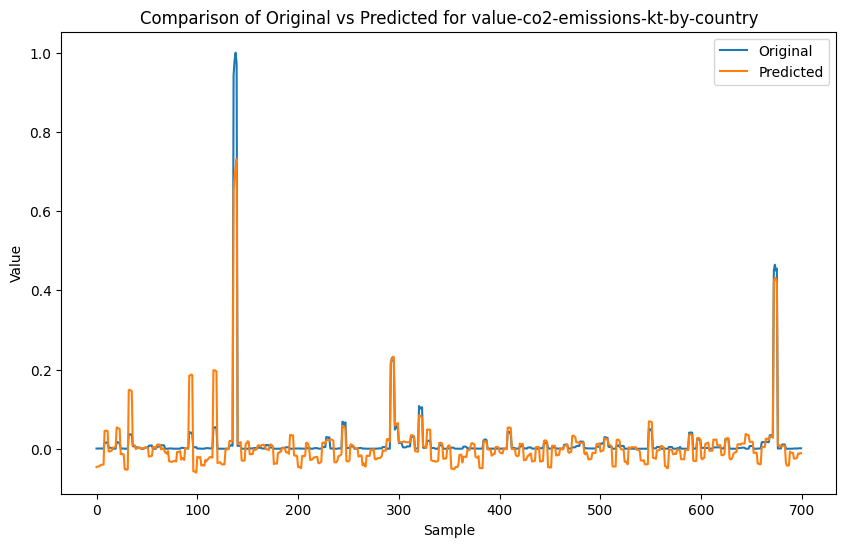

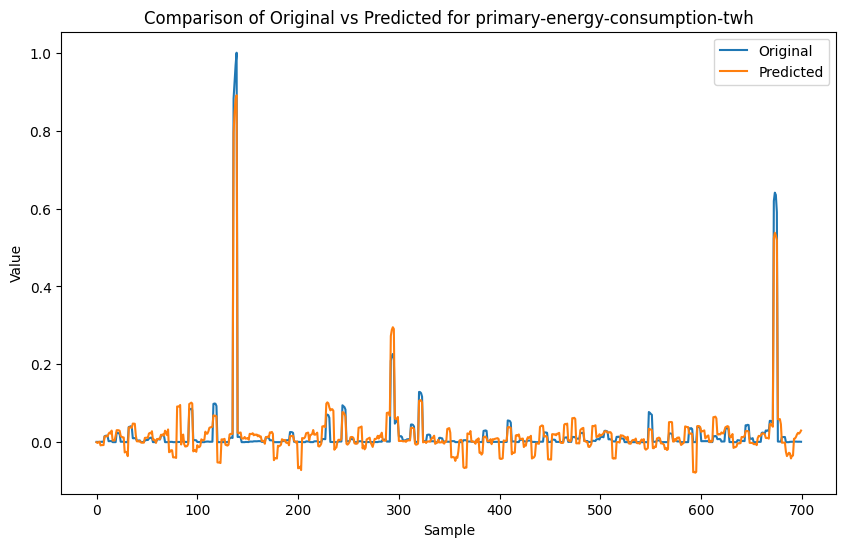

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.neural_network import MLPRegressor
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    # Create an MLP regressor instance
    # Note: Adjust the hidden_layer_sizes and other parameters as needed
    model = MLPRegressor(random_state=42, hidden_layer_sizes=(300,), max_iter=600)

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Metrics for the model
    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()



#### **3.5. XGBoost Regressor**

In [ ]:
xgboost_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = xgboost_model_df.drop(columns=target_columns)
targets = xgboost_model_df[target_columns]
X_fs = xgboost_model_df[features.columns]
Y_fs = xgboost_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = xgboost_model_df[xgboost_model_df['year'] <= 2016]
test_data = xgboost_model_df[xgboost_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
R2 Score: 0.9379063763329559
Mean Absolute Error: 0.0026377820178104046
Mean Squared Error: 0.0004268019394247626
Root Mean Squared Error: 0.02065918535239864
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'co

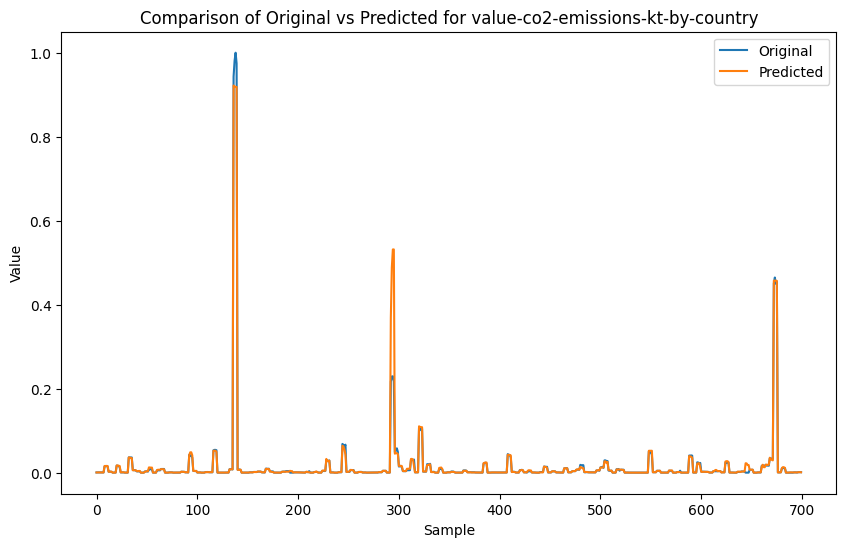

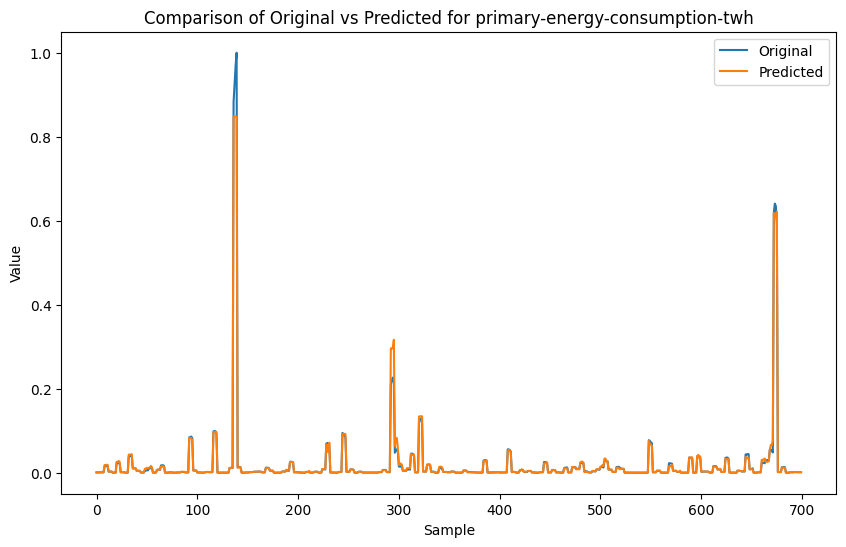

In [ ]:
import xgboost as xgb
import numpy as np
import pandas as pd
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[selected_features_dict[target]]
    y_train = train_data[target]
    X_test = test_data[selected_features_dict[target]]
    y_test = test_data[target]

    # Create an XGBoost regressor instance
    model = xgb.XGBRegressor(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.6. LightGBM Regressor**

In [ ]:
lightgbm_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = lightgbm_model_df.drop(columns=target_columns)
targets = lightgbm_model_df[target_columns]
X_fs = lightgbm_model_df[features.columns]
Y_fs = lightgbm_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = lightgbm_model_df[lightgbm_model_df['year'] <= 2016]
test_data = lightgbm_model_df[lightgbm_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


In [ ]:
!pip install lightgbm

Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2912
[LightGBM] [Info] Number of data points in the train set: 2949, number of used features: 13
[LightGBM] [Info] Start training from score 0.013518
R2 Score: 0.958548188831905
Mean Absolute Error: 0.002774998966711057
Mean Squ

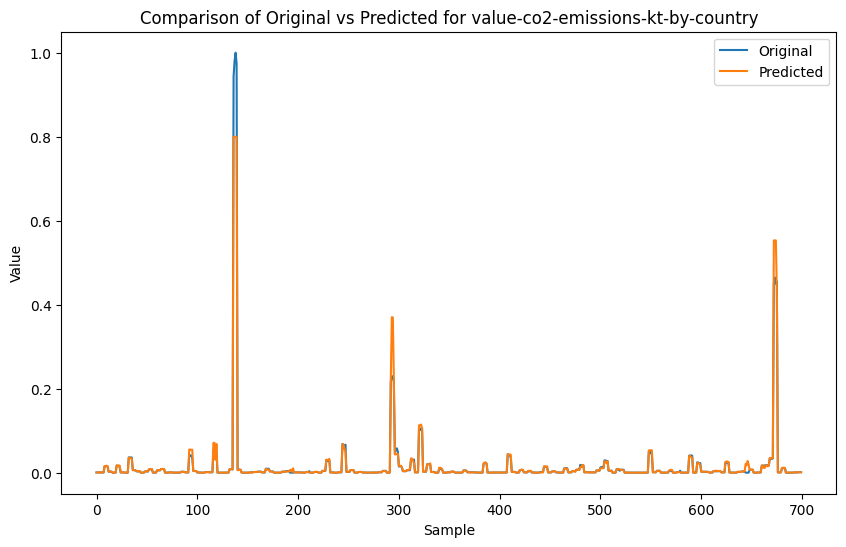

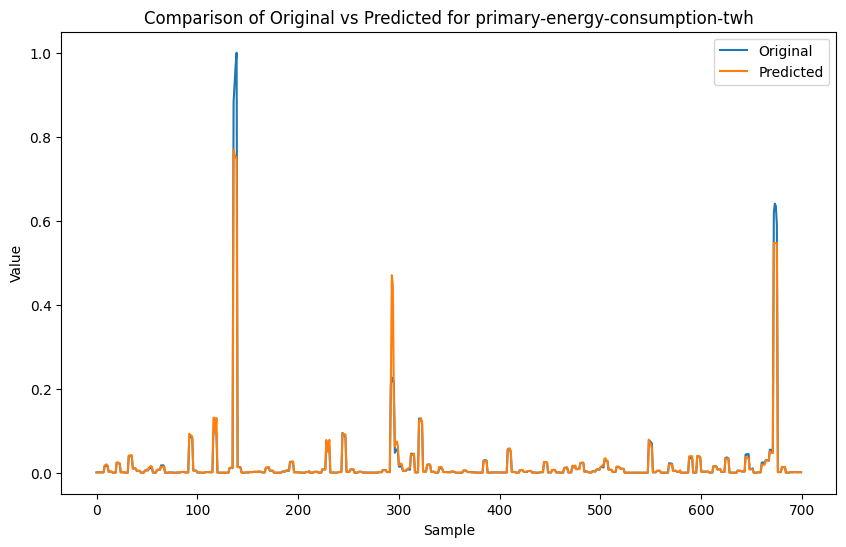

In [ ]:
import numpy as np
import pandas as pd
from lightgbm import LGBMRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    # Create a LightGBM regressor instance
    model = LGBMRegressor(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.7. CatBoost Regressor**

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 3.2 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/google/colab/_pip.py:86: ResourceWarning:

unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.10/dist-packages/catboost-1.2.3.dist-info/top_level.txt' mode='r' encoding='UTF-8'>



In [ ]:
catboost_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = catboost_model_df.drop(columns=target_columns)
targets = catboost_model_df[target_columns]
X_fs = catboost_model_df[features.columns]
Y_fs = catboost_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = catboost_model_df[catboost_model_df['year'] <= 2016]
test_data = catboost_model_df[catboost_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<frozen importlib._bootstrap>:241: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 216 from C header, got 232 from PyObject



Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
R2 Score: 0.983317709841531
Mean Absolute Error: 0.0015443870376125291
Mean Squared Error: 0.000114666102140535
Root Mean Squared Error: 0.010708225910043877
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'cou

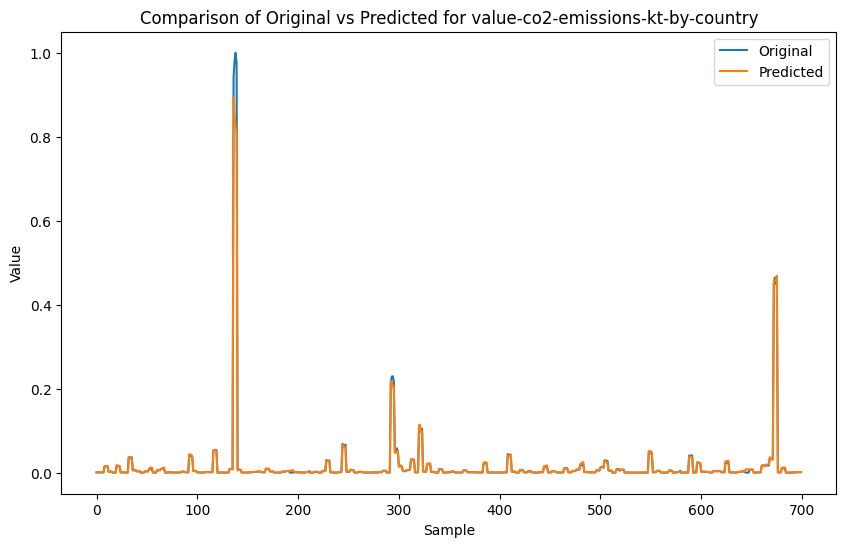

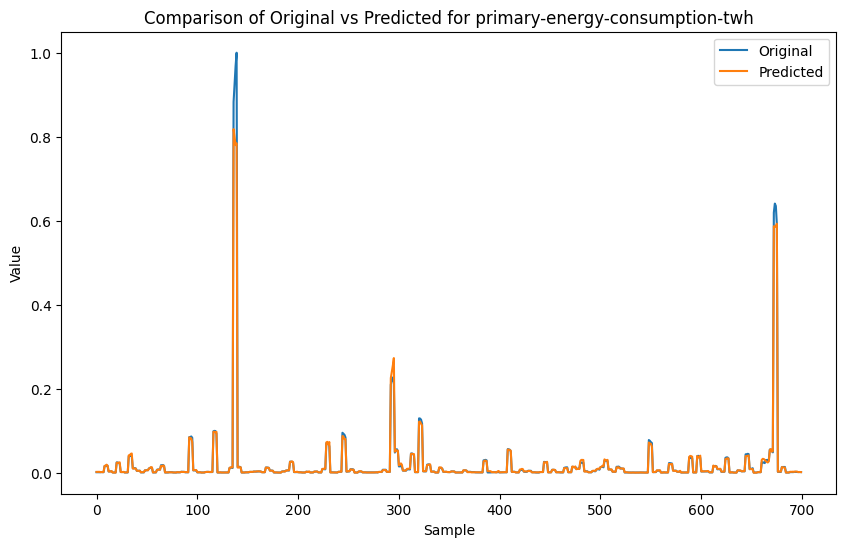

In [ ]:
import numpy as np
import pandas as pd
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[selected_features_dict[target]]
    y_train = train_data[target]
    X_test = test_data[selected_features_dict[target]]
    y_test = test_data[target]

    # Create a CatBoost regressor instance
    model = CatBoostRegressor(random_state=42, silent=True)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.8. KNN Regressor**

In [ ]:
knn_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = knn_model_df.drop(columns=target_columns)
targets = knn_model_df[target_columns]
X_fs = knn_model_df[features.columns]
Y_fs = knn_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = knn_model_df[knn_model_df['year'] <= 2016]
test_data = knn_model_df[knn_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
R2 Score: 0.4990193643297408
Mean Absolute Error: 0.01625018957555554
Mean Squared Error: 0.0034435018330521575
Root Mean Squared Error: 0.05868135847994794
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'coun

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

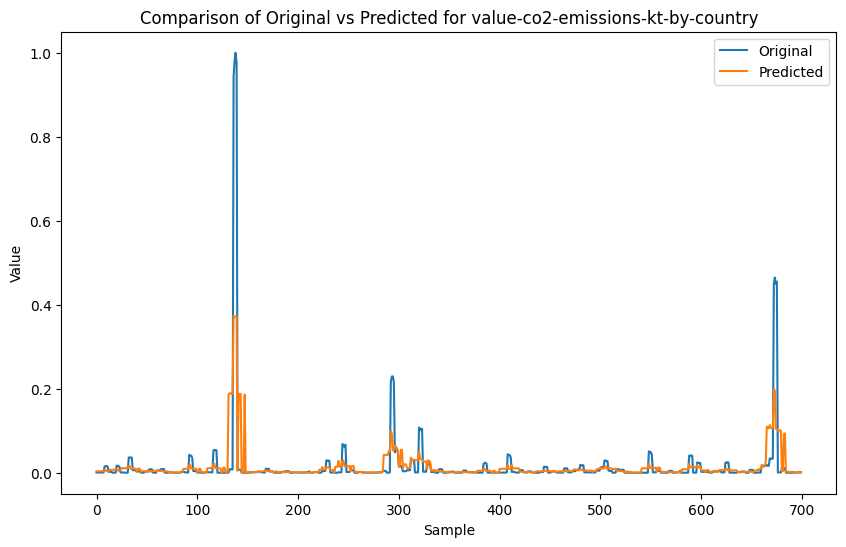

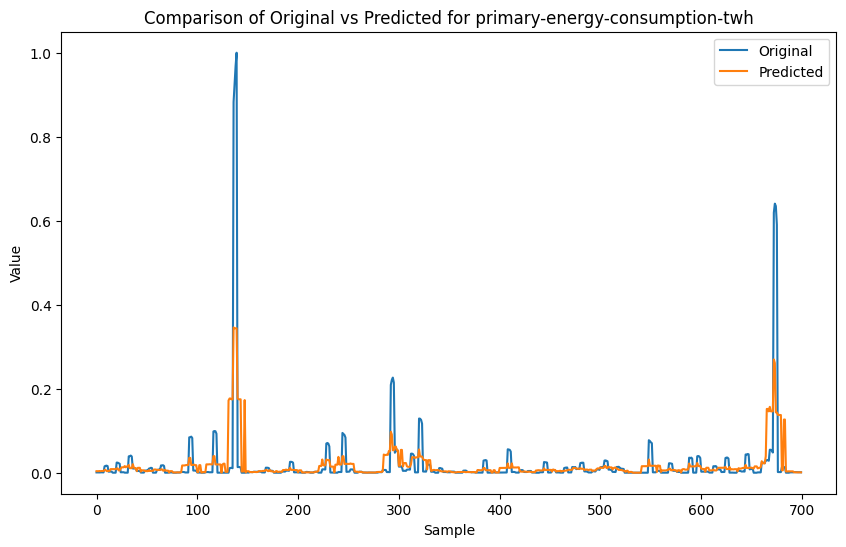

In [ ]:
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    # Create a KNN regressor instance
    # Note: Adjust the number of neighbors as needed
    model = KNeighborsRegressor(n_neighbors=5)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.9. Decision Tree Regressor**

In [ ]:
dt_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = dt_model_df.drop(columns=target_columns)
targets = dt_model_df[target_columns]
X_fs = dt_model_df[features.columns]
Y_fs = dt_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = dt_model_df[dt_model_df['year'] <= 2016]
test_data = dt_model_df[dt_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')
R2 Score: 0.9948700283745511
Mean Absolute Error: 0.001387071834489593
Mean Squared Error: 3.526097704775551e-05
Root Mean Squared Error: 0.005938095405747159
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['electricity-from-nuclear-twh', 'low-carbon-electricity-electricity',
       'density-n-p-km2', 'electricity-from-fossil-fuels-twh', 'co

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

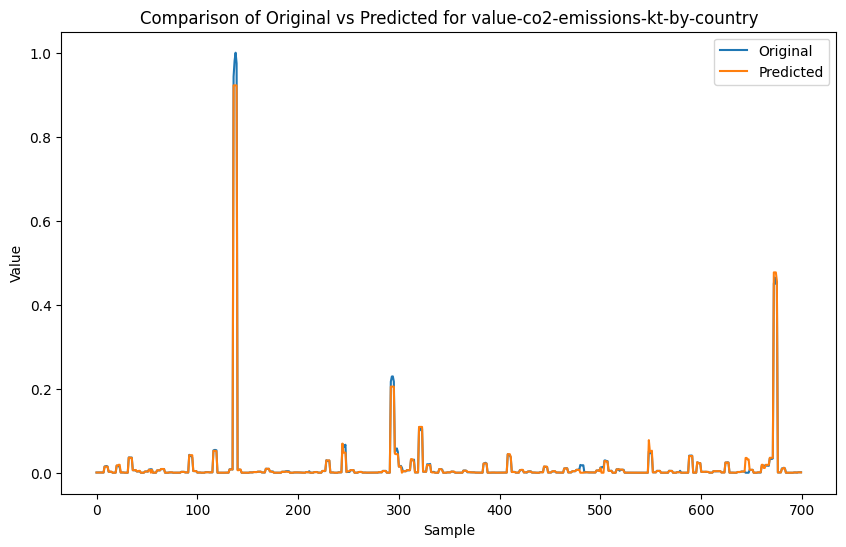

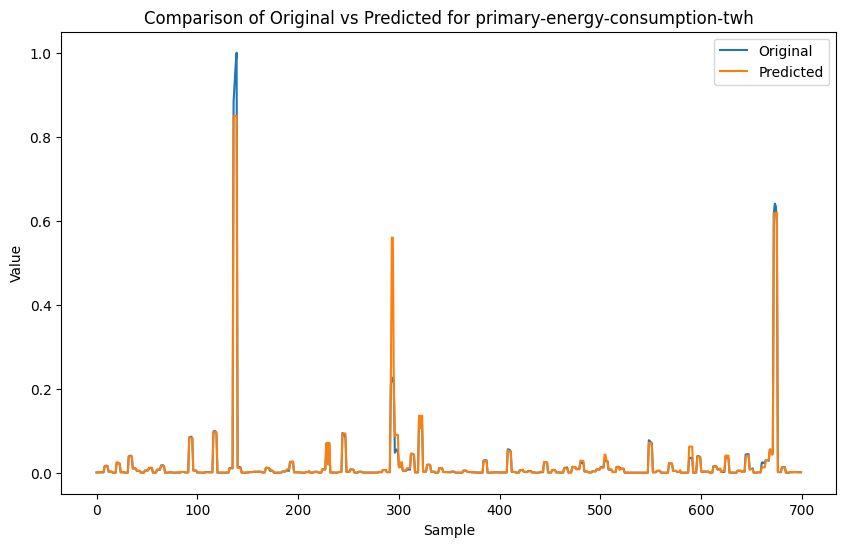

In [ ]:
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    # Create a Decision Tree regressor instance
    model = DecisionTreeRegressor(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.9. LSTM**

In [ ]:
lstm_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = lstm_model_df.drop(columns=target_columns)
targets = lstm_model_df[target_columns]
X_fs = lstm_model_df[features.columns]
Y_fs = lstm_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = lstm_model_df[lstm_model_df['year'] <= 2016]
test_data = lstm_model_df[lstm_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['low-carbon-electricity-electricity', 'density-n-p-km2',
       'primary-energy-consumption-twh', 'electricity-from-fossil-fuels-twh',
       'country', 'population',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-renewables-twh', 'gdp-per-capita', 'land-area-km2',
       'year', 'access-to-clean-fuels-for-cooking',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Epoch 1/50
93/93 [==============================] - 8s 6ms/step - loss: 0.0046
Epoch 2/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0046
Epoch 3/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0046
Epoch 4/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0046
Epoch 5/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0046
Epoch 6/50
93/93 [==============================] - 1s 7ms/step - loss: 0.0046
Epoch 7/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0046
Epoch 8/50
93/93 [==============================] - 1s 7ms/step - loss: 0.0045
Epoch 9/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0045
Epoch 10/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0046
Epoch 11/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0045
Epoch 12/50
93/93 [==============================] - 1s 7ms/step - loss: 0.0046
Epoch 13/50
93/93 [==============================

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



Epoch 1/50
93/93 [==============================] - 5s 5ms/step - loss: 0.0050
Epoch 2/50
93/93 [==============================] - 1s 6ms/step - loss: 0.0050
Epoch 3/50
93/93 [==============================] - 1s 7ms/step - loss: 0.0050
Epoch 4/50
93/93 [==============================] - 0s 5ms/step - loss: 0.0050
Epoch 5/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 6/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0051
Epoch 7/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 8/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 9/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 10/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 11/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 12/50
93/93 [==============================] - 0s 4ms/step - loss: 0.0050
Epoch 13/50
93/93 [==============================

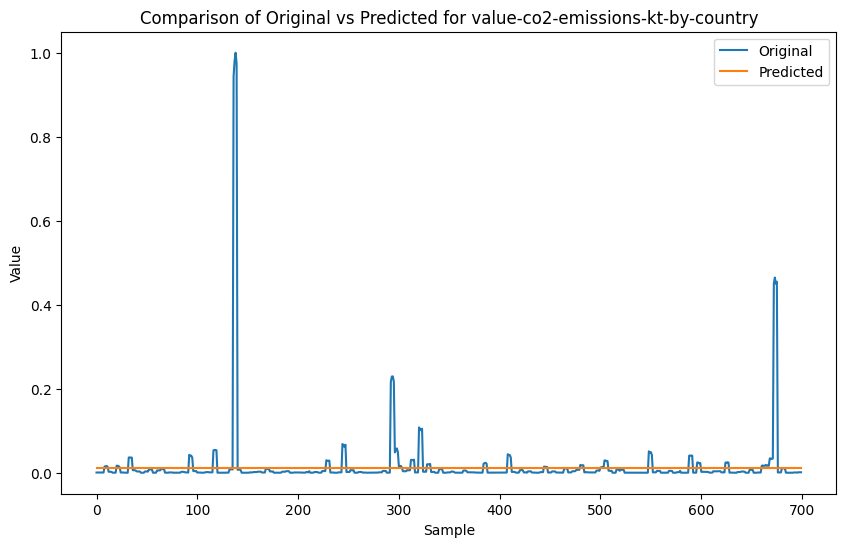

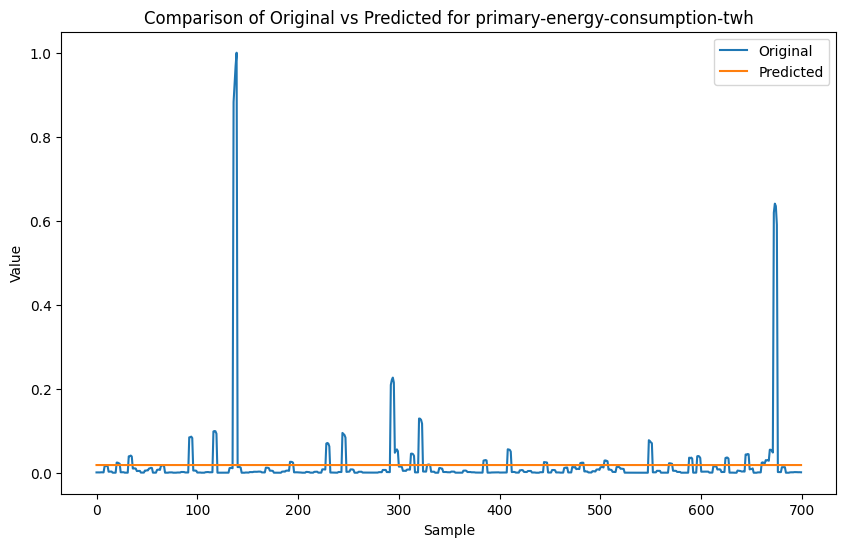

In [ ]:
import numpy as np
import pandas as pd
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs.columns:
    print(f"Processing: {target}")

    # Skipping columns
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    # Preparing Data
    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    feat_aux = set(selected_features_dict[target].tolist())
    feat_aux.update(['year', 'country'])
    feat_aux = pd.Index(feat_aux)
    print("Features Selected:", temp_X_fs[feat_aux].columns)

    # Splitting features and target
    X_train = train_data[feat_aux]
    y_train = train_data[target]
    X_test = test_data[feat_aux]
    y_test = test_data[target]

    # Reshape input for LSTM: [samples, time steps, features]
    X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
    X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

    # Define the LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])))
    model.add(LSTM(units=50))
    model.add(Dense(units=1))

    # Compile and fit the model
    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train_reshaped, y_train, epochs=50, batch_size=32)

    # Make predictions
    y_pred = model.predict(X_test_reshaped).flatten() # Flatten if y_pred is multi-dimensional

    # Store the results
    results[target] = {'Original': y_test, 'Predicted': y_pred}

    # Metrics
    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Original'].reset_index(drop=True), label='Original')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Original vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


#### **3.10. ARIMA**

In [ ]:
arima_model_df = df_col_scale.copy()
arima_model_df['year'] = pd.to_datetime(arima_model_df['year'], format='%Y')

# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = arima_model_df.drop(columns=target_columns)
targets = arima_model_df[target_columns]
X_fs = arima_model_df[features.columns]
Y_fs = arima_model_df[targets.columns]

# Splitting the DataFrame based on the year
# Assuming the 'year' column is already in datetime format
arima_model_df['year'] = arima_model_df['year'].dt.year
arima_model_df.set_index(pd.to_datetime(arima_model_df['year'], format='%Y'), inplace=True)

# Define your cutoff year for the training and testing split
cutoff_year = pd.to_datetime('2016', format='%Y')

# Splitting the dataset into training and testing sets
train_data = arima_model_df[arima_model_df.index <= cutoff_year]
test_data = arima_model_df[arima_model_df.index > cutoff_year]
# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


Processing: value-co2-emissions-kt-by-country


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency infor

Forecast for value-co2-emissions-kt-by-country: 2949    0.001044
2950    0.001038
2951    0.001021
2952    0.001003
2953    0.000980
          ...   
3644   -0.012427
3645   -0.012446
3646   -0.012466
3647   -0.012485
3648   -0.012505
Name: predicted_mean, Length: 700, dtype: float64
Mean Squared Error: 0.007328701759825878
Root Mean Squared Error: 0.08560783702340503
Processing: primary-energy-consumption-twh


/usr/local/lib/python3.10/dist-packages/pandas/core/indexes/multi.py:643: DeprecationWarning:

`cumproduct` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `cumprod` instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/reshape/util.py:60: DeprecationWarning:

`product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/indexes/multi.py:643: DeprecationWarning:

`cumproduct` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `cumprod` instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/reshape/util.py:60: DeprecationWarning:

`product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/indexes/multi.py:643: DeprecationWarning:

`cumproduct` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `

Forecast for primary-energy-consumption-twh: 2949    0.001135
2950    0.001116
2951    0.001081
2952    0.001037
2953    0.000987
          ...   
3644   -0.028708
3645   -0.028751
3646   -0.028794
3647   -0.028836
3648   -0.028879
Name: predicted_mean, Length: 700, dtype: float64
Mean Squared Error: 0.008835563882463201
Root Mean Squared Error: 0.09399768019724317


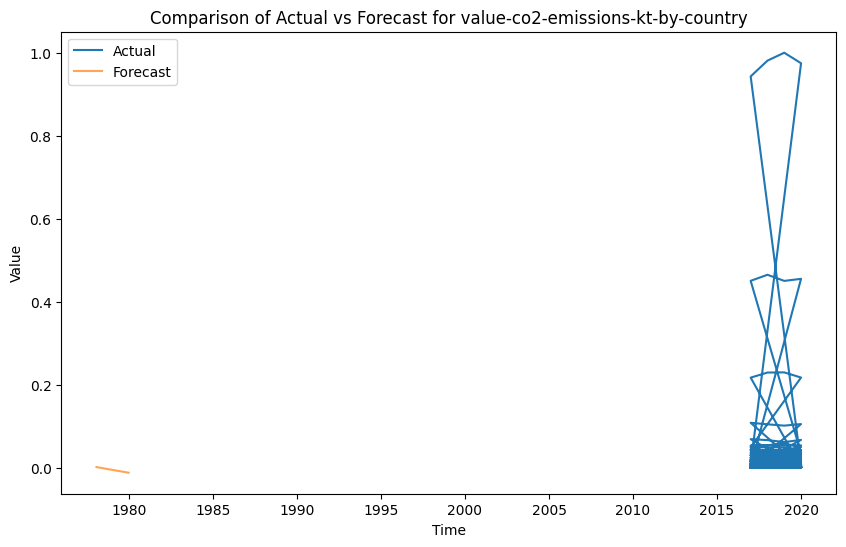

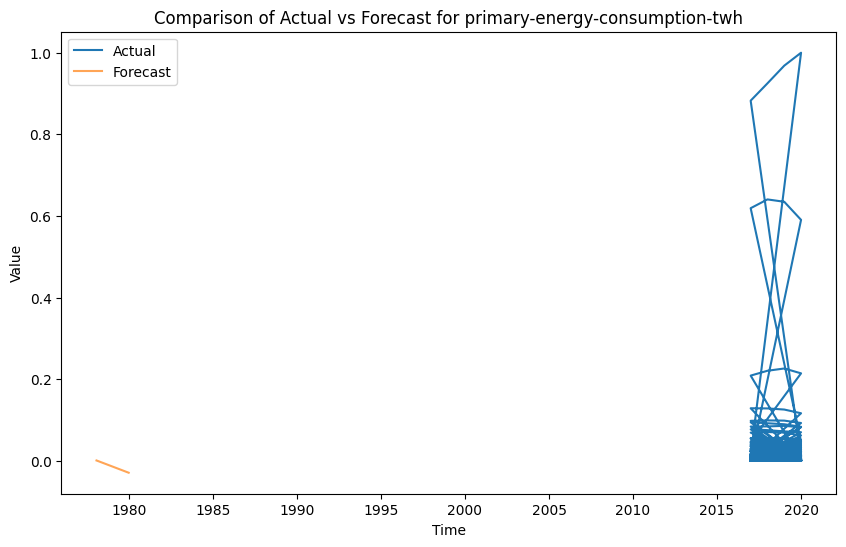

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column in Y_fs
for target in Y_fs.columns:
    print(f"Processing: {target}")

    # Selecting the target column for ARIMA
    time_series = train_data[target]

    # ARIMA Model - Tune these parameters (p,d,q) for your specific dataset
    p, d, q = 5, 2, 0  # Example values
    model = sm.tsa.ARIMA(time_series, order=(p, d, q))

    # Fit the model
    model_fit = model.fit()

    # Forecast
    steps = len(test_data)
    forecast = model_fit.forecast(steps=steps)

    # Obtain the actual values from the test set for comparison
    actual = test_data[target]

    # Store the results
    results[target] = {'Actual': actual, 'Forecast': forecast}

    # Calculate metrics
    mse = mean_squared_error(actual, forecast)
    print(f"Forecast for {target}: {forecast}")
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {np.sqrt(mse)}")

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Actual'], label='Actual')
    plt.plot(data['Forecast'], label='Forecast', alpha=0.7)
    plt.title(f'Comparison of Actual vs Forecast for {target}')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()



#### **3.10. Gradient Boosting Regressor**

In [ ]:
gradient_model_df = df_col_scale.copy()
# Selecting target columns and feature columns
target_columns = ['value-co2-emissions-kt-by-country', 'primary-energy-consumption-twh']
features = gradient_model_df.drop(columns=target_columns)
targets = gradient_model_df[target_columns]
X_fs = gradient_model_df[features.columns]
Y_fs = gradient_model_df[targets.columns]

# Splitting the DataFrame based on the year
train_data = gradient_model_df[gradient_model_df['year'] <= 2016]
test_data = gradient_model_df[gradient_model_df['year'] > 2016]

# Print the years that are in the train and test data
print(f"Train years: {train_data['year'].unique()}")
print(f"Test years: {test_data['year'].unique()}")

Train years: [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016]
Test years: [2017 2018 2019 2020]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Processing: value-co2-emissions-kt-by-country
Skipped Columns: ['primary-energy-consumption-twh']
Features Selected: Index(['access-to-clean-fuels-for-cooking',
       'renewable-energy-share-in-the-total-final-energy-consumption',
       'electricity-from-fossil-fuels-twh', 'electricity-from-renewables-twh',
       'low-carbon-electricity-electricity',
       'energy-intensity-level-of-primary-energy-mj-2017-ppp-gdp',
       'gdp-per-capita', 'density-n-p-km2', 'land-area-km2', 'population',
       'primary-energy-consumption-twh'],
      dtype='object')
R2 Score: 0.9848280324001267
Mean Absolute Error: 0.0022516397207438237
Mean Squared Error: 0.00010428486556426179
Root Mean Squared Error: 0.010211996159628233
Processing: primary-energy-consumption-twh
Skipped Columns: ['value-co2-emissions-kt-by-country']
Features Selected: Index(['access-to-electricity-of-population',
       'access-to-clean-fuels-for-cooking',
       'renewable-energy-share-in-the-total-final-energy-consumption',

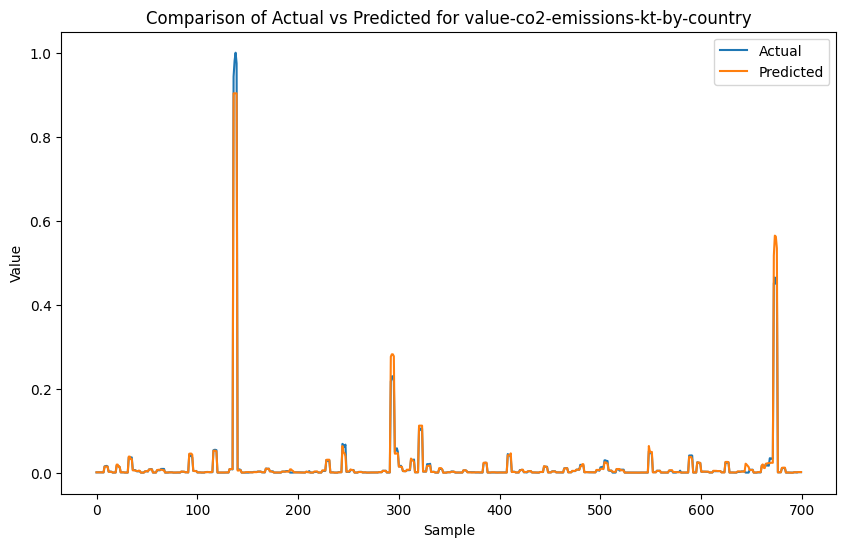

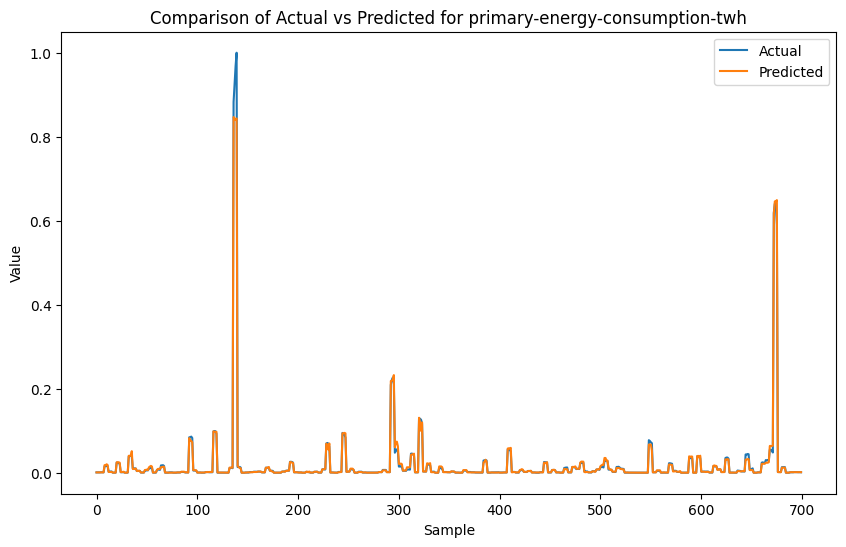

In [ ]:
import numpy as np
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt

# Initialize a dictionary to store original and predicted values
results = {}

# Loop through each target column
for target in Y_fs:
    print(f"Processing: {target}")
    # Determine which columns are not being processed in this iteration
    skipped_columns = [c for c in Y_fs.columns if c != target]
    print(f"Skipped Columns: {skipped_columns}")

    # Create a temporary DataFrame that includes the skipped columns
    temp_X_fs = X_fs.copy()
    temp_X_fs[skipped_columns] = Y_fs[skipped_columns]
    print("Features Selected:", temp_X_fs[selected_features_dict[target]].columns)

    # Splitting features and target for the current target column
    X_train = train_data[selected_features_dict[target]]
    y_train = train_data[target]
    X_test = test_data[selected_features_dict[target]]
    y_test = test_data[target]

    # Create a Gradient Boosting regressor instance
    model = GradientBoostingRegressor(random_state=42)
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Store the results
    results[target] = {'Actual': y_test, 'Predicted': y_pred}

    # Metrics for the model
    print(f"R2 Score: {r2_score(y_test, y_pred)}")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}")
    print(f"Mean Squared Error: {mean_squared_error(y_test, y_pred)}")
    print(f"Root Mean Squared Error: {np.sqrt(mean_squared_error(y_test, y_pred))}")

# After processing all targets, visualize the comparison
for target, data in results.items():
    plt.figure(figsize=(10, 6))
    plt.plot(data['Actual'].reset_index(drop=True), label='Actual')
    plt.plot(data['Predicted'], label='Predicted')
    plt.title(f'Comparison of Actual vs Predicted for {target}')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


### **3.11. Predict Next five years for Energy Consumption with RF**

#### **3.11.1. Simple Test adding 5 years.**

Country: 34
MSE: 0.014974307148157265
MAE: 0.11830823350951414
R2 Score: -14.851113972220524
RMSE: 0.12236955155657499

Country: 169
MSE: 0.0005102695016974186
MAE: 0.0220891226146549
R2 Score: -0.020009968756487417
RMSE: 0.022589145661078433



<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

Country: 74
MSE: 0.00032827864507054813
MAE: 0.017377013652102934
R2 Score: -12.861615321277897
RMSE: 0.01811846144325031



<ipython-input-133-3a0a69f61b8d>:62: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



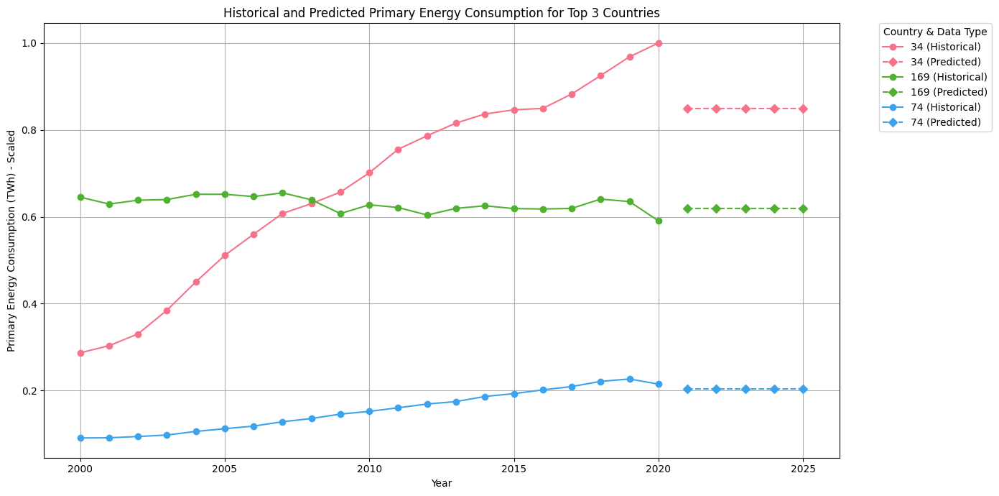

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Example DataFrame loading - replace with your actual data loading process

df_predict_simple = df_col_scale.copy()

df_sorted = df_predict_simple.sort_values(by=['country', 'year'])

target_primary_energy = 'primary-energy-consumption-twh'

# Define features for the model
features_primary_energy = selected_features_dict['primary-energy-consumption-twh']

# Sum the energy consumption for each country and get the top 3 countries
top_countries = df_sorted.groupby('country')[target_primary_energy].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Train models and predict future consumption for each of the top countries
for country in top_countries:
    country_data = df_sorted[df_sorted['country'] == country]

    # Split the data into training and testing sets
    train_data = country_data.head(len(country_data)-3)  # Using all but last 3 years for training
    test_data = country_data.tail(3)  # Last 3 years for testing

    X_train = train_data[features_primary_energy]
    y_train = train_data[target_primary_energy]
    X_test = test_data[features_primary_energy]
    y_test = test_data[target_primary_energy]

    # Random Forest model
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    # Predictions
    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    rmse = np.sqrt(mse)

    print(f'Country: {country}')
    print(f'MSE: {mse}')
    print(f'MAE: {mae}')
    print(f'R2 Score: {r2}')
    print(f'RMSE: {rmse}\n')

    # Predict for the next 5 years using the last available data
    last_year_data = country_data.iloc[[-1]][features_primary_energy]
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)

    for year in future_years:
        future_prediction = model.predict(last_year_data)
        df_predictions = df_predictions.append({
            'year': year,
            'country': country,
            target_primary_energy: future_prediction[0]
        }, ignore_index=True)

# Correcting the 'year' data type for plotting
df_predictions['year'] = df_predictions['year'].astype(int)

# Combine historical and predicted data for plotting
df_combined = pd.concat([df_sorted, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))
prediction_start_year = 2021

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_primary_energy], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_primary_energy], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted Primary Energy Consumption for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('Primary Energy Consumption (TWh) - Scaled')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


#### **3.11.2. After training with last 10 years.**

Country: 34
MSE: 0.09544252436029815
MAE: 0.2781754393152827
R2 Score: -4.36548133724927
RMSE: 0.3089377354100631

Country: 169
MSE: 0.00075637396345221
MAE: 0.026296259537206067
R2 Score: -3.293917169043591
RMSE: 0.02750225378859358



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names

<ipython-input-134-3da6cd9f4bc7>:66: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names

<ipython-input-134-3da6cd9f4bc7>:66: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names

<ipython-input-134-3da6cd9f4bc7>:66: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use p

Country: 74
MSE: 0.0024846464667227924
MAE: 0.046320187696340644
R2 Score: -6.218964288339304
RMSE: 0.049846228209592676



<ipython-input-134-3da6cd9f4bc7>:66: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



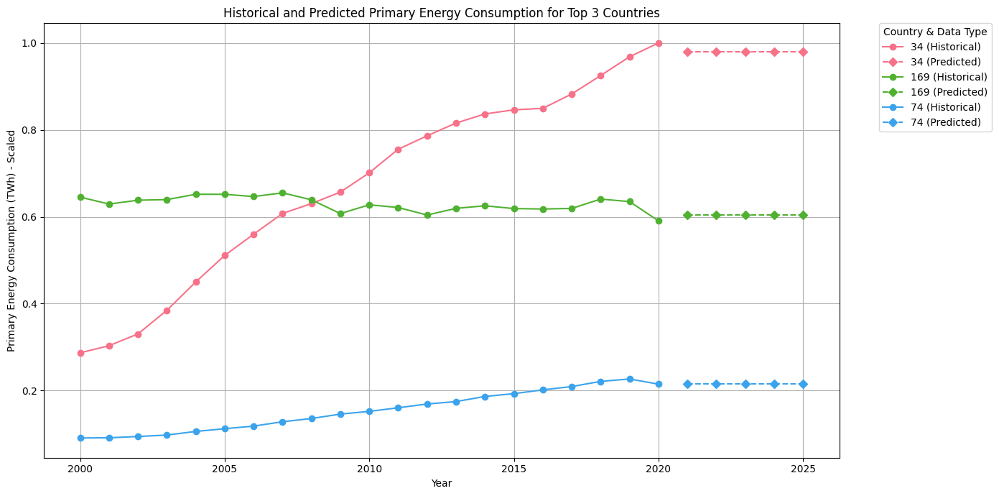

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Assuming 'df_col_scale' is your DataFrame with scaled columns
df_predict_simple_mod = df_col_scale.copy()

# Ensure 'year' is treated as a datetime type for easier manipulation
#df_predict_simple_mod['year'] = pd.to_datetime(df_predict_simple_mod['year'], format='%Y')

target_primary_energy = 'primary-energy-consumption-twh'

# Define features for the model, adjust as necessary
features_primary_energy = selected_features_dict['primary-energy-consumption-twh']

# Filter the data for the period 2010 to 2020
df_filtered = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]

# Separate training (2010-2020) and testing datasets (2000-2009)
df_train = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]
df_test = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2000) & (df_predict_simple_mod['year'] <= 2009)]

# Sum the energy consumption for each country and get the top 3 countries from the filtered data
top_countries = df_filtered.groupby('country')[target_primary_energy].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Train models and predict future consumption for each of the top countries
for country in top_countries:
    country_data_train = df_train[df_train['country'] == country]

    # Use all available data for training
    X_train = country_data_train[features_primary_energy]
    y_train = country_data_train[target_primary_energy]

    # Create and train the Random Forest Regressor
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    country_data_test = df_test[df_test['country'] == country]
    X_test = country_data_test[features_primary_energy]
    y_test = country_data_test[target_primary_energy]
    test_predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, test_predictions)
    mae = mean_absolute_error(y_test, test_predictions)
    r2 = r2_score(y_test, test_predictions)
    rmse = np.sqrt(mse)

    print(f'Country: {country}')
    print(f'MSE: {mse}')
    print(f'MAE: {mae}')
    print(f'R2 Score: {r2}')
    print(f'RMSE: {rmse}\n')

    # Predict for the next 5 years using the last available data
    last_year_data = country_data_train[features_primary_energy].iloc[-1:].values.reshape(1, -1)
    last_year = country_data_train['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)

    for year in future_years:
        future_prediction = model.predict(last_year_data)
        df_predictions = df_predictions.append({
            'year': year,
            'country': country,
            target_primary_energy: future_prediction[0]
        }, ignore_index=True)

# Correcting the 'year' data type for plotting
#df_predictions['year'] = pd.to_datetime(df_predictions['year'])

# Combine the filtered historical data with the new predictions for plotting
df_combined = pd.concat([df_predict_simple_mod, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_primary_energy], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_primary_energy], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted Primary Energy Consumption for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('Primary Energy Consumption (TWh) - Scaled')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


#### **3.11.3. After using features target.**

In [ ]:
from sklearn.impute import KNNImputer
import pandas as pd

def apply_knn_imputation_by_year(df, n_neighbors=5, year=None, year_column='year'):
    """
    Applies KNN imputation to fill in missing values in a DataFrame, considering data up to a specified year.
    Assumes data is already scaled.

    Parameters:
    - df: The pandas DataFrame with missing values to impute, already scaled.
    - n_neighbors: The number of neighboring samples to use for imputation. Default is 5.
    - year: The year up to which the data should be considered for imputation. Default is None.
    - year_column: The name of the column in the DataFrame that contains the year information. Default is 'year'.

    Returns:
    - DataFrame with missing values imputed.
    """
    # Filter the DataFrame to include only rows up to and including the specified year, if provided
    if year is not None and year_column in df.columns:
        df_filtered = df[df[year_column] <= year].copy()
    else:
        df_filtered = df.copy()

    # Initialize the KNNImputer
    imputer = KNNImputer(n_neighbors=n_neighbors, weights='uniform', metric='nan_euclidean')

    # Apply the imputer to the DataFrame
    imputed_data = imputer.fit_transform(df_filtered)

    # Convert the imputed data back to a DataFrame
    imputed_df = pd.DataFrame(imputed_data, columns=df_filtered.columns, index=df_filtered.index)

    # If year filtering was applied, update only the relevant part of the original DataFrame
    if year is not None:
        df.update(imputed_df)
        return df
    else:
        return imputed_df

In [ ]:
from sklearn.ensemble import RandomForestRegressor  # or RandomForestClassifier
import pandas as pd
import numpy as np

def impute_with_random_forest(df, model, features, year=None, year_column='year'):
    """
    Imputes missing values using a pre-trained Random Forest model.

    Parameters:
    - df: DataFrame with missing values to impute.
    - model: Pre-trained Random Forest model.
    - features: List of features to use for imputation.
    - year: Optional year to limit the imputation to data up to this year.
    - year_column: Name of the column containing year information.
    """
    # Optionally filter by year
    if year is not None and year_column in df.columns:
        df_filtered = df[df[year_column] <= year].copy()
    else:
        df_filtered = df.copy()

    for feature in features:
        # Identify rows where the feature is missing
        missing_mask = df_filtered[feature].isnull()

        # Continue if no missing values for the current feature
        if not missing_mask.any():
            continue

        # Prepare the training data (excluding rows where the target feature is missing)
        X_train = df_filtered.loc[~missing_mask, features].drop(columns=[feature])
        y_train = df_filtered.loc[~missing_mask, feature]

        # Fit the model if not already fitted
        # model.fit(X_train, y_train)  # Uncomment if the model needs to be fitted

        # Predict the missing values
        X_missing = df_filtered.loc[missing_mask, features].drop(columns=[feature])
        predicted_values = model.predict(X_missing)

        # Fill in the missing values in the DataFrame
        df_filtered.loc[missing_mask, feature] = predicted_values

    # Update the original DataFrame if year filtering was applied
    if year is not None:
        df.update(df_filtered)
        return df
    else:
        return df_filtered

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

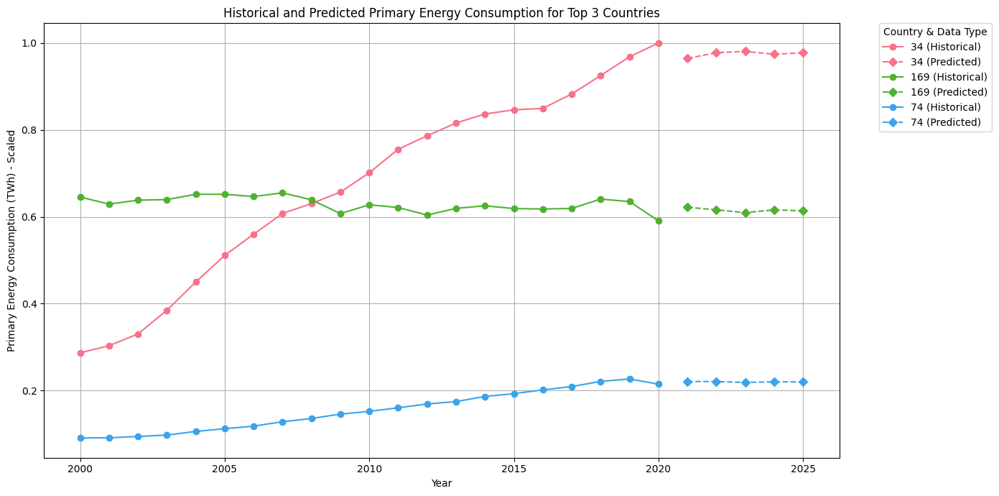

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Assuming 'df_col_scale' is your DataFrame with scaled columns
df_predict_simple_mod = df_col_scale.copy()

# Ensure 'year' is treated as a datetime type for easier manipulation
#df_predict_simple_mod['year'] = pd.to_datetime(df_predict_simple_mod['year'], format='%Y')

target_primary_energy = 'primary-energy-consumption-twh'

# Define features for the model, adjust as necessary
features_primary_energy = selected_features_dict['primary-energy-consumption-twh']

# Filter the data for the period 2010 to 2020
df_filtered = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]

# Sum the energy consumption for each country and get the top 3 countries from the filtered data
top_countries = df_filtered.groupby('country')[target_primary_energy].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Train models and predict future consumption for each of the top countries
for country in top_countries:
    country_data = df_filtered[df_filtered['country'] == country]

    # Use all available data for training
    X_train = country_data[features_primary_energy]
    y_train = country_data[target_primary_energy]

    # Create and train the Random Forest Regressor
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    # Predict for the next 5 years using the last available data
    last_year_data = country_data[features_primary_energy].iloc[-1:].values.reshape(1, -1)
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)
    future_data = pd.DataFrame(future_years, columns=['year'])
    future_data['country'] = country
    country_data_future = pd.concat([country_data, future_data], ignore_index=True)
    #print(f'Country data future: {country_data_future}')

    for year in future_years:
        country_data_future = apply_knn_imputation_by_year(country_data_future, n_neighbors=3, year=year)
        year_predicted = impute_with_random_forest(country_data_future, model, features_primary_energy, year)
        year_predicted_filt = year_predicted.copy()
        df_predictions = df_predictions.append(year_predicted_filt[year_predicted_filt['year'] == year], ignore_index=True)

# Combine the filtered historical data with the new predictions for plotting
df_combined = pd.concat([df_predict_simple_mod, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_primary_energy], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_primary_energy], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted Primary Energy Consumption for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('Primary Energy Consumption (TWh) - Scaled')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


#### **3.11.4. Hyperparameters Gridsearch.**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Assuming 'df_col_scale' is your DataFrame with scaled columns
df_predict_simple_mod = df_col_scale.copy()

# Ensure 'year' is treated as a datetime type for easier manipulation
#df_predict_simple_mod['year'] = pd.to_datetime(df_predict_simple_mod['year'], format='%Y')

target_primary_energy = 'primary-energy-consumption-twh'

# Define features for the model, adjust as necessary
features_primary_energy = selected_features_dict['primary-energy-consumption-twh']

# Filter the data for the period 2010 to 2020
df_filtered = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]

# Sum the energy consumption for each country and get the top 3 countries from the filtered data
top_countries = df_filtered.groupby('country')[target_primary_energy].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Parameter grid for Random Forest Regressor
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at every split
    'max_depth': [10, 20, 30, None],   # Maximum number of levels in tree
    'min_samples_split': [2, 5, 10],   # Minimum number of samples required to split a node
    'min_samples_leaf': [1, 2, 4],     # Minimum number of samples required at each leaf node
    'bootstrap': [True, False]         # Method of selecting samples for training each tree
}

# Train models and predict future consumption for each of the top countries
for country in top_countries:
    country_data = df_filtered[df_filtered['country'] == country]
    X_train = country_data[features_primary_energy]
    y_train = country_data[target_primary_energy]

    # Initialize the base model
    rf = RandomForestRegressor(random_state=42)

    # Create the GridSearchCV object
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

    # Fit the grid search to the data
    grid_search.fit(X_train, y_train)

    # Best estimator after grid search
    model = grid_search.best_estimator_

    # Predict for the next 5 years using the last available data
    last_year_data = country_data[features_primary_energy].iloc[-1:].values.reshape(1, -1)
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)
    future_data = pd.DataFrame(future_years, columns=['year'])
    future_data['country'] = country
    country_data_future = pd.concat([country_data, future_data], ignore_index=True)

    for year in future_years:
        country_data_future = apply_knn_imputation_by_year(country_data_future, n_neighbors=3, year=year)
        year_predicted = impute_with_random_forest(country_data_future, model, features_primary_energy, year)
        year_predicted_filt = year_predicted.copy()
        df_predictions = df_predictions.append(year_predicted_filt[year_predicted_filt['year'] == year], ignore_index=True)

# Combine the filtered historical data with the new predictions for plotting
df_combined = pd.concat([df_predict_simple_mod, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))

# Determine the prediction start year
prediction_start_year = df_filtered['year'].max() + 1

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    plt.plot(historical_data['year'], historical_data[target_primary_energy], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])
    plt.plot(predicted_data['year'], predicted_data[target_primary_energy], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted Primary Energy Consumption for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('Primary Energy Consumption (TWh) - Scaled')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, r2_score

# Assuming 'df_col_scale' is your DataFrame with scaled columns
df_predict_simple_mod = df_col_scale.copy()

# Define features for the model, adjust as necessary
features_primary_energy = selected_features_dict['primary-energy-consumption-twh']

# Filter the data for the period 2010 to 2020
df_filtered = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]

# Sum the energy consumption for each country and get the top 3 countries from the filtered data
top_countries = df_filtered.groupby('country')[target_primary_energy].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Define the parameter grid to search
param_grid = {
    'n_estimators': [100, 200],  # Example: Adjust according to your computational capacity
    'max_depth': [None, 10, 20],  # Example: You may want to explore deeper trees depending on your dataset
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False]
}

# Define the scoring metric
scorer = make_scorer(r2_score)

# Train models and predict future consumption for each of the top countries
for country in top_countries:
    country_data = df_filtered[df_filtered['country'] == country]

    # Use all available data for training
    X_train = country_data[features_primary_energy]
    y_train = country_data[target_primary_energy]

    # Create the grid search object
    rf_grid_search = GridSearchCV(RandomForestRegressor(random_state=42), param_grid, scoring=scorer, cv=5, n_jobs=-1, verbose=2)

    # Perform grid search to find the best hyperparameters
    rf_grid_search.fit(X_train, y_train)

    # Print the best parameters and the best score
    print(f"Best parameters for {country}: ", rf_grid_search.best_params_)
    print(f"Best score for {country}: ", rf_grid_search.best_score_)

    # Use the best estimator to predict future consumption
    best_model = rf_grid_search.best_estimator_

    # Predict for the next 5 years using the last available data
    last_year_data = country_data[features_primary_energy].iloc[-1:].values.reshape(1, -1)
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)
    future_data = pd.DataFrame(future_years, columns=['year'])
    future_data['country'] = country

    for year in future_years:
        # Assuming apply_knn_imputation_by_year and impute_with_random_forest are defined and applicable here
        country_data_future = apply_knn_imputation_by_year(future_data, n_neighbors=10, year=year)  # Placeholder for your imputation logic
        # Direct prediction as imputation step details are not provided
        future_prediction = best_model.predict(last_year_data)
        df_predictions = df_predictions.append({'year': year, 'country': country, target_primary_energy: future_prediction[0]}, ignore_index=True)

# The rest of your plotting code remains unchanged
df_combined = pd.concat([df_predict_simple_mod, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_primary_energy], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_primary_energy], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted Primary Energy Consumption for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('Primary Energy Consumption (TWh) - Scaled')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()

### **3.12. Predict Next five years for CO2 Emission with RF**

#### **3.12.1. Simple Test adding 5 years.**

Country: 34
MSE: 0.005905441033348464
MAE: 0.0751879795480342
R2 Score: -49.696780788301744
RMSE: 0.07684686742703611



<ipython-input-138-a79ddadcc467>:63: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-138-a79ddadcc467>:63: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-138-a79ddadcc467>:63: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-138-a79ddadcc467>:63: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-138-a79ddadcc467>:63: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-138-a79ddadcc467>:63: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

Country: 169
MSE: 0.000297421305475812
MAE: 0.013908119883869918
R2 Score: -6.955532767720766
RMSE: 0.01724590691949287

Country: 74
MSE: 0.0002847946294149433
MAE: 0.015820373524111225
R2 Score: -7.4786277793224745
RMSE: 0.016875859368190506



/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)



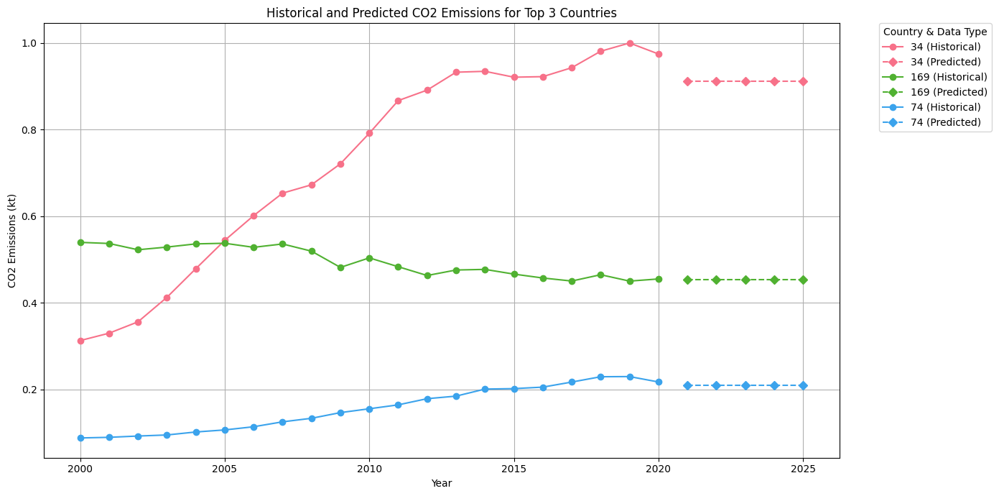

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Example DataFrame loading - replace with your actual data loading process

df_predict_simple = df_col_scale.copy()

df_sorted = df_predict_simple.sort_values(by=['country', 'year'])

# Adjust this target for CO2 emissions
target_co2_emission = 'value-co2-emissions-kt-by-country'

# This should be correctly set to the features relevant for CO2 emissions prediction
features_co2_emission = selected_features_dict['value-co2-emissions-kt-by-country']

# Sum the CO2 emissions for each country and get the top 3 countries
top_countries = df_sorted.groupby('country')[target_co2_emission].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Train models and predict future CO2 emissions for each of the top countries
for country in top_countries:
    country_data = df_sorted[df_sorted['country'] == country]

    # Split the data into training and testing sets
    train_data = country_data.head(len(country_data)-3)  # Using all but last 3 years for training
    test_data = country_data.tail(3)  # Last 3 years for testing

    X_train = train_data[features_co2_emission].values.reshape(-1, 1) if isinstance(features_co2_emission, str) else train_data[features_co2_emission]
    y_train = train_data[target_co2_emission]
    X_test = test_data[features_co2_emission].values.reshape(-1, 1) if isinstance(features_co2_emission, str) else test_data[features_co2_emission]
    y_test = test_data[target_co2_emission]

    # Random Forest model
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    # Predictions
    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    mae = mean_absolute_error(y_test, predictions)
    r2 = r2_score(y_test, predictions)
    rmse = np.sqrt(mse)

    print(f'Country: {country}')
    print(f'MSE: {mse}')
    print(f'MAE: {mae}')
    print(f'R2 Score: {r2}')
    print(f'RMSE: {rmse}\n')

    # Predict for the next 5 years using the last available data
    last_year_data = country_data.iloc[[-1]][features_co2_emission].values.reshape(-1, 1) if isinstance(features_co2_emission, str) else country_data.iloc[[-1]][features_co2_emission]
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)

    for year in future_years:
        future_prediction = model.predict(last_year_data)
        df_predictions = df_predictions.append({
            'year': year,
            'country': country,
            target_co2_emission: future_prediction[0]
        }, ignore_index=True)

# Correcting the 'year' data type for plotting
df_predictions['year'] = df_predictions['year'].astype(int)

# Combine historical and predicted data for plotting
df_combined = pd.concat([df_sorted, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))
prediction_start_year = df_sorted['year'].max() + 1  # Assuming the prediction starts after the last year in the dataset

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_co2_emission], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_co2_emission], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted CO2 Emissions for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('CO2 Emissions (kt)')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


#### **3.12.2. After training with last 10 years.**

Country: 34
MSE: 0.12881073956116723
MAE: 0.3288513949887907
R2 Score: -5.235031885258113
RMSE: 0.3589021308952724



<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

Country: 169
MSE: 0.0017392870240238285
MAE: 0.039104815804036894
R2 Score: -5.534598936901523
RMSE: 0.04170476020820439

Country: 74
MSE: 0.0033341583709495157
MAE: 0.054530235519599145
R2 Score: -8.137357594783142
RMSE: 0.05774217151224498



<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-139-4d6e70f25b2d>:70: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

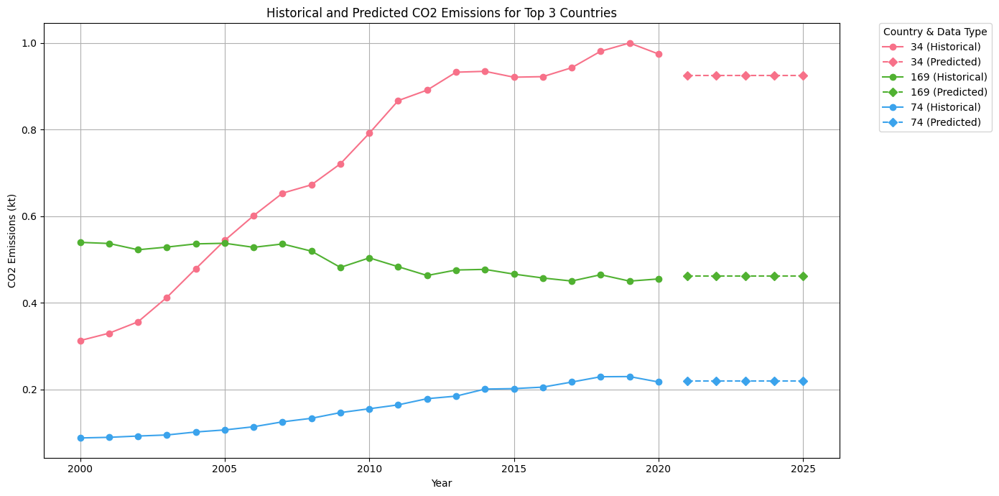

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Example DataFrame loading - replace with your actual data loading process
# Assuming 'df_col_scale' is your DataFrame with scaled columns
df_predict_simple_mod = df_col_scale.copy()

df_sorted = df_predict_simple_mod.sort_values(by=['country', 'year'])

# Adjust this target for CO2 emissions
target_co2_emission = 'value-co2-emissions-kt-by-country'

# This should be correctly set to the features relevant for CO2 emissions prediction
features_co2_emission = selected_features_dict['value-co2-emissions-kt-by-country']

# Sum the CO2 emissions for each country and get the top 3 countries
top_countries = df_sorted.groupby('country')[target_co2_emission].sum().nlargest(3).index

# Filter the data for the period 2010 to 2020
df_filtered = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]

# Separate training (2010-2020) and testing datasets (2000-2009)
df_train = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]
df_test = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2000) & (df_predict_simple_mod['year'] <= 2009)]

# Sum the energy consumption for each country and get the top 3 countries from the filtered data
top_countries = df_filtered.groupby('country')[target_primary_energy].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Train models and predict future CO2 emissions for each of the top countries
for country in top_countries:
    country_data_train = df_train[df_train['country'] == country]

    # Use all available data for training
    X_train = country_data_train[features_co2_emission]
    y_train = country_data_train[target_co2_emission]

    # Create and train the Random Forest Regressor
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    country_data_test = df_test[df_test['country'] == country]
    X_test = country_data_test[features_co2_emission]
    y_test = country_data_test[target_co2_emission]
    test_predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, test_predictions)
    mae = mean_absolute_error(y_test, test_predictions)
    r2 = r2_score(y_test, test_predictions)
    rmse = np.sqrt(mse)

    print(f'Country: {country}')
    print(f'MSE: {mse}')
    print(f'MAE: {mae}')
    print(f'R2 Score: {r2}')
    print(f'RMSE: {rmse}\n')

    # Predict for the next 5 years using the last available data
    last_year_data = country_data.iloc[[-1]][features_co2_emission].values.reshape(-1, 1) if isinstance(features_co2_emission, str) else country_data.iloc[[-1]][features_co2_emission]
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)

    for year in future_years:
        future_prediction = model.predict(last_year_data)
        df_predictions = df_predictions.append({
            'year': year,
            'country': country,
            target_co2_emission: future_prediction[0]
        }, ignore_index=True)

# Correcting the 'year' data type for plotting
df_predictions['year'] = df_predictions['year'].astype(int)

# Combine historical and predicted data for plotting
df_combined = pd.concat([df_sorted, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))
prediction_start_year = df_sorted['year'].max() + 1  # Assuming the prediction starts after the last year in the dataset

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_co2_emission], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_co2_emission], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted CO2 Emissions for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('CO2 Emissions (kt)')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


#### **3.12.3. After using features target.**

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)

/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning:

np.find_comm

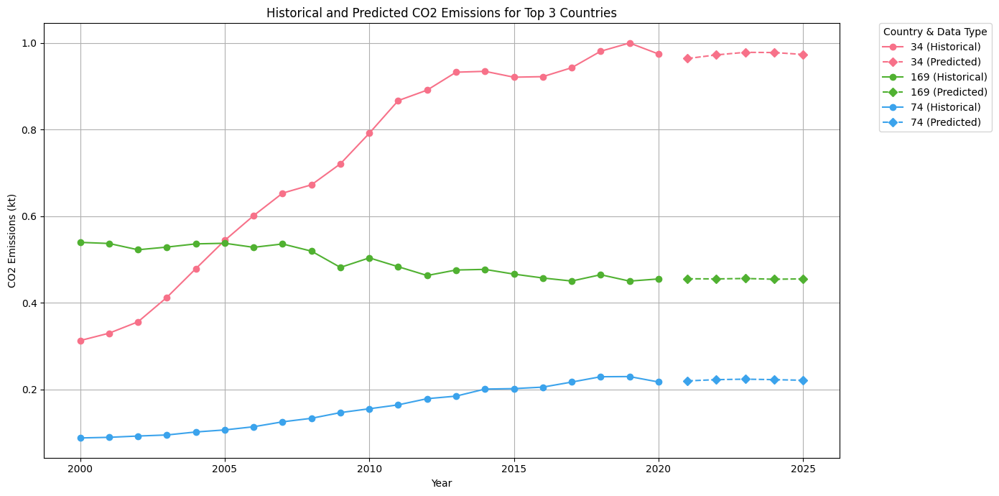

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Assuming 'df_col_scale' is your DataFrame with scaled columns
df_predict_simple_mod = df_col_scale.copy()

# Ensure 'year' is treated as a numeric type if not already
# Uncomment the following line if your 'year' column is not in numeric format
# df_predict_simple_mod['year'] = pd.to_numeric(df_predict_simple_mod['year'])

target_co2_emission = 'value-co2-emissions-kt-by-country'

# Define features for the model, adjust as necessary
features_co2_emission = selected_features_dict['value-co2-emissions-kt-by-country']

# Filter the data for the period 2010 to 2020
df_filtered = df_predict_simple_mod[(df_predict_simple_mod['year'] >= 2010) & (df_predict_simple_mod['year'] <= 2020)]

# Sum the CO2 emissions for each country and get the top 3 countries from the filtered data
top_countries = df_filtered.groupby('country')[target_co2_emission].sum().nlargest(3).index

# Initialize an empty DataFrame to store predictions
df_predictions = pd.DataFrame()

# Train models and predict future CO2 emissions for each of the top countries
for country in top_countries:
    country_data = df_filtered[df_filtered['country'] == country]

    # Use all available data for training
    X_train = country_data[features_co2_emission]
    y_train = country_data[target_co2_emission]

    # Create and train the Random Forest Regressor
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    # Predict for the next 5 years using the last available data
    last_year_data = country_data[features_co2_emission].iloc[-1:].values.reshape(1, -1)
    last_year = country_data['year'].max()
    future_years = np.arange(last_year + 1, last_year + 6)
    future_data = pd.DataFrame(future_years, columns=['year'])
    future_data['country'] = country
    country_data_future = pd.concat([country_data, future_data], ignore_index=True)

    for year in future_years:
        country_data_future = apply_knn_imputation_by_year(country_data_future, n_neighbors=5, year=year)
        year_predicted = impute_with_random_forest(country_data_future, model, features_co2_emission, year)
        year_predicted_filt = year_predicted.copy()
        df_predictions = df_predictions.append(year_predicted_filt[year_predicted_filt['year'] == year], ignore_index=True)

# Combine the filtered historical data with the new predictions for plotting
df_combined = pd.concat([df_predict_simple_mod, df_predictions], ignore_index=True, sort=False)

# Plotting adjustments
plt.figure(figsize=(14, 7))

# Use a single color palette for both historical and predicted data
palette = sns.color_palette("husl", len(top_countries))
prediction_start_year = 2021  # Update as necessary based on your dataset's last year

# Plot historical and predicted data using the same color but different markers
for i, country in enumerate(top_countries):
    historical_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] < prediction_start_year)]
    predicted_data = df_combined[(df_combined['country'] == country) & (df_combined['year'] >= prediction_start_year)]

    # Historical data with circle markers
    plt.plot(historical_data['year'], historical_data[target_co2_emission], label=f'{country} (Historical)', marker='o', linestyle='-', color=palette[i])

    # Predicted data with diamond markers
    plt.plot(predicted_data['year'], predicted_data[target_co2_emission], label=f'{country} (Predicted)', marker='D', linestyle='--', color=palette[i])

plt.title('Historical and Predicted CO2 Emissions for Top 3 Countries')
plt.xlabel('Year')
plt.ylabel('CO2 Emissions (kt)')
plt.legend(title='Country & Data Type', loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


## **4. Conclusion**

Random Forest and comparative had better performance than the rest over all, but after the selection metrics significantly declined upon retraining the model with data grouped by country and year, the capacity to capture and predict overarching trends persisted. This divergence between metric performance and trend prediction accuracy underscores a crucial insight—that the true value of a model in time series analysis often transcends numerical scores, residing instead in its ability to discern the direction of future movements. This phenomenon highlights the importance of evaluating models not just on their immediate accuracy but on their relevance and utility in forecasting trends, especially in complex, real-world scenarios where decisions hinge on understanding future directions rather than exact figures.

## **5. Future works**

Moving forward, the experience points toward a dual path of refinement and exploration. The initial success in trend prediction, despite lower metrics, indicates the potential for further enhancing model performance through targeted feature engineering and the incorporation of domain-specific knowledge. Concurrently, there lies a compelling case for exploring alternative modeling approaches that are inherently suited to capturing temporal dependencies and handling grouped data. Models for seasonal trends, or LSTM networks for deep learning-based time series forecasting, present promising results. Additionally, simpler models with strong regularization techniques, like Linear, Lasso or Ridge Regression, could offer a balance between complexity and interpretability. These future endeavors aim not only to elevate metric scores but also to bolster the model's innate ability to forecast trends, ensuring that predictive analytics remains both accurate and actionable in the face of evolving data landscapes